# Topic Modeling and Information Retrieval 


This activity focuses on the use of BERTopic for Topic Modeling (TM) and Information Retrieval (IR), offering a step-by-step Python implementation guide. Participants will learn about textual data preprocessing, document embedding generation, dimensionality reduction, and hierarchical clustering for latent topic identification. 


Lecturer: Giovanni Maria De Filippis (Biologist)

Notebook url: https://shorturl.at/axDSX

# System Preparation

## Install requirements

In [1]:
import importlib
import subprocess
try:
    # Check if the module is already installed
    importlib.import_module('torch')
    print("torch is already installed.")
except ImportError:
    # If the module is not installed, try installing it
    subprocess.run(['pip3', 'install', 'torch', 'torchvision', 'torchaudio', '--index-url', 'https://download.pytorch.org/whl/cu118'])
    print("torch was installed correctly.")

import torch
print("Torch version:",torch.__version__)
print("Is CUDA enabled?",torch.cuda.is_available())
if torch.cuda.is_available():
    print(torch.randn(1).cuda())
else:
    #get torch here: https://pytorch.org/get-started/locally/
    subprocess.run(['pip3', 'uninstall', 'torch'])
    subprocess.run(['pip3', 'install', 'torch', 'torchvision', 'torchaudio', '--index-url', 'https://download.pytorch.org/whl/cu118'])

torch is already installed.
Torch version: 2.1.1+cu118
Is CUDA enabled? True
tensor([-0.7999], device='cuda:0')


In [ ]:
#install requirements
!pip install nltk  
!pip install gdown
!pip install pandas
!pip install bertopic
!pip install wordcloud
!pip install matplotlib
!pip install bertopic[visualization]  #This has to be installed separately

In [1]:
import pychatgpt as op

## Import packages

In [2]:
###### Import packages ######
import os
import io
import sys
import ast
import re
import random
import zipfile
import requests
import time
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
if not 'google.colab' in sys.modules:
    !pip install pyperclip
    import pyperclip as pc

# Plotly: Set notebook mode to work offline
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()

# Set data directory
data_path = 'data/'
if not os.path.exists(data_path):
    os.makedirs(data_path)


###### HTML display ######
from IPython.display import display, HTML

# HTML template for two side-by-side boxes
html_template = """
<div style="display: flex;">
    <div style="border: 1px solid black; padding: 10px; margin: 10px;">
        <h3>Original Text:</h3>
        <p>{}</p>
    </div>
    <div style="border: 1px solid black; padding: 10px; margin: 10px;">
        <h3>Processed Text:</h3>
        <p>{}</p>
    </div>
</div>
"""


###### Define simple functions ######

def simple_bool(message):
    choose = input(message+" (y/n): ").lower()
    your_bool = choose in ["y", "yes","yea","sure"]
    return your_bool
        
def get_gitfile(url, flag='', dir = os.getcwd()):
    url = url.replace('blob','raw')
    response = requests.get(url)
    file_name = flag + url.rsplit('/',1)[1]
    file_path = os.path.join(dir, file_name)
    if response.status_code == 200:
        with open(file_path, 'wb') as file:
            file.write(response.content)
        print(f"File downloaded successfully. Saved as {file_name}")
    else:
        print("Unable to download the file.")

# Get Docs from Scopus 


**Define Reserach Context**

1. Integrative Bioinformatics and System Biology Domain
This field involves the integration of biological data with computational analysis to understand complex biological systems at a holistic level. It combines biology, computer science, and statistics to gain insights into biological processes.

3. Semantic Technologies and Information Retrieval Domain
Semantic technologies focus on understanding and representing the meaning of data. Information retrieval involves the organized retrieval of relevant information from large collections of data based on user queries. This domain leverages semantics to enhance information retrieval processes.

 **Search String Creation for Scopus**
 
- Combine keywords related to bioinformatics, systems biology, computational analysis, biological data integration.
- Utilize Boolean operators (AND, OR, NOT) to refine search results.
- Incorporate specific terms like "network analysis," "gene expression," "biological pathways," "data integration."

- Include keywords related to semantic technologies, data meaning, information retrieval, user queries.
- Use specific terms such as "ontology," "semantic web," "natural language processing," "information extraction."
- Employ truncation (*) and wildcard (?) symbols for variations of terms.

In [40]:
# Scopus Search String Generator
def create_string(data_list):
    return '(' + ' OR '.join([f'"{item}"' for item in data_list]) + ')'

##########################################################

### Reaserch Domains ###

# 1. Integrative Bioinformatics and System Biology Domain

p_ = ["integrative bioinformatic*",  
      "biological data integration",
      
      ### System Biology
      'biochemical interaction*',
      'biochemical network*',
      'biochemical pathway*',
      'biological network*',
      'regulatory network*',
      'gene* interaction*',
      'gene network*',
      'gene expression network*',
      'protein interaction*',
      'PPI network*',
      'systems biology',

      ### Multi Omics  
      'multi omic* integration*',
      'multi omic* network*',
      'multiomic* integration*',
      'multiomic* network*',
      'integrated omic*',
      '*omic* integration*',
      '*omic* data integration*',
      'trans omic* network*'
      ]


# 2. Semantic Technologies and Information Retrieval Domain

i_ = ['semantic integration',
      'semantic technolog*',
      'semantic alignment',
      'semantic similarity',
      'semantic matching',
      'semantic mapping',
      'semantic artifact*',
      'semantic web',

      'knowledge representation',
      'knowledge organization',
      "knowledge extraction",
      "knowledge based",
      "knowledge driven",
      'knowledge graph*',

      'information system* retrieval',
      'information retrieval',

      #'graph-based data management*',
      'graph database*',
      'graph quer*',
      'graph modeling',
      'graph representation',
      'graph based',

      'ontology integration',
      'ontology matching',
      'ontology merging',
      'ontology mapping',
      'web ontology language',

      'link prediction',
      'text mining',
      'natural language process*'
      ]

population = create_string(p_)
intervention = create_string(i_)
picoc = [population, intervention]


# Exlude terms
excluded_term = []
excluded_term = create_string(excluded_term)

# to Scopus
center = ' AND '.join(picoc)
excluded = ' AND NOT '+ excluded_term
search_string = f'TITLE-ABS-KEY({center})'

### Exclusion Criteria ###
year=''' AND PUBYEAR > 2013 AND PUBYEAR < 2025 '''
area='''AND ( LIMIT-TO ( SUBJAREA , "BIOC" ) OR LIMIT-TO ( SUBJAREA , "COMP" ))''' #OR LIMIT-TO ( SUBJAREA , "MEDI" ) OR LIMIT-TO ( SUBJAREA , "PHAR" ) '''
language='''AND ( LIMIT-TO ( LANGUAGE,"English"))'''
doc_type = f'''AND  ( LIMIT-TO ( DOCTYPE,"ar" ) OR LIMIT-TO ( DOCTYPE,"cp" ) )'''

if len(excluded_term) > 0:
    search_string_ec = f'TITLE-ABS-KEY({center} {excluded}) {year} {area} {doc_type} {language}'
else:
    search_string_ec = f'TITLE-ABS-KEY({center} ) {year} {area} {doc_type} {language}'
    
#import pyperclip as pc
#pc.copy(search_string_ec)

print(search_string_ec)

TITLE-ABS-KEY(("integrative bioinformatic*" OR "biological data integration" OR "biochemical interaction*" OR "biochemical network*" OR "biochemical pathway*" OR "biological network*" OR "regulatory network*" OR "gene* interaction*" OR "gene network*" OR "gene expression network*" OR "protein interaction*" OR "PPI network*" OR "systems biology" OR "multi omic* integration*" OR "multi omic* network*" OR "multiomic* integration*" OR "multiomic* network*" OR "integrated omic*" OR "*omic* integration*" OR "*omic* data integration*" OR "trans omic* network*") AND ("semantic integration" OR "semantic technolog*" OR "semantic alignment" OR "semantic similarity" OR "semantic matching" OR "semantic mapping" OR "semantic artifact*" OR "semantic web" OR "knowledge representation" OR "knowledge organization" OR "knowledge extraction" OR "knowledge based" OR "knowledge driven" OR "knowledge graph*" OR "information system* retrieval" OR "information retrieval" OR "graph database*" OR "graph quer*" O

## Scopus Advanced Search
https://www.scopus.com/search/form.uri?display=advanced

**Search String**
TITLE-ABS-KEY(("integrative bioinformatic*" OR "biological data integration" OR "biochemical interaction*" OR "biochemical network*" OR "biochemical pathway*" OR "biological network*" OR "regulatory network*" OR "gene* interaction*" OR "gene network*" OR "gene expression network*" OR "protein interaction*" OR "PPI network*" OR "systems biology" OR "multi omic* integration*" OR "multi omic* network*" OR "multiomic* integration*" OR "multiomic* network*" OR "integrated omic*" OR "*omic* integration*" OR "*omic* data integration*" OR "trans omic* network*") AND ("semantic integration" OR "semantic technolog*" OR "semantic alignment" OR "semantic similarity" OR "semantic matching" OR "semantic mapping" OR "semantic artifact*" OR "semantic web" OR "knowledge representation" OR "knowledge organization" OR "knowledge extraction" OR "knowledge based" OR "knowledge driven" OR "knowledge graph*" OR "information system* retrieval" OR "information retrieval" OR "graph database*" OR "graph quer*" OR "graph modeling" OR "graph representation" OR "graph based" OR "ontology integration" OR "ontology matching" OR "ontology merging" OR "ontology mapping" OR "web ontology language" OR "link prediction" OR "text mining" OR "natural language process*")  AND NOT ())  AND PUBYEAR > 2013 AND PUBYEAR < 2025  AND ( LIMIT-TO ( SUBJAREA , "BIOC" ) OR LIMIT-TO ( SUBJAREA , "COMP" )) AND  ( LIMIT-TO ( DOCTYPE,"ar" ) OR LIMIT-TO ( DOCTYPE,"cp" ) ) AND ( LIMIT-TO ( LANGUAGE,"English"))

**Download CSV**

In [11]:
#### Load Corpus
def load_corpus_from_csv(doc_name = 'scopus.csv', abs_col= 'Abstract'):
    global docs
    
    df = pd.read_csv(doc_name, index_col=0)
    df['paper_texts'] = df["Title"] + " $ " + df["Abstract"] 
    docs = df['paper_texts'].drop_duplicates().to_list()
    #docs = df.Abstract.drop_duplicates().to_list()
    
    print('\nEntry count:',len(df),
          '\nAbstract count:', df[abs_col].nunique(),
          '\nEntry without abstract:',len(df)-df.Abstract.nunique())

    return docs

docs = load_corpus_from_csv(data_path+"scopus (14).csv")
pd.Series(docs)


Entry count: 1818 
Abstract count: 1817 
Entry without abstract: 1


0       Asymmetric Learning for Graph Neural Network b...
1       A hierarchical convolutional model for biomedi...
2       Hypergraphs and centrality measures identifyin...
3       Hyperbolic hierarchical knowledge graph embedd...
4       TEMINET: A Co-Informative and Trustworthy Mult...
                              ...                        
1813    GeneProf data: A resource of curated, integrat...
1814    Saccharomyces genome database provides new reg...
1815    Reverse top-k search using random walk with re...
1816    The MetaCyc database of metabolic pathways and...
1817    Negatome 2.0: A database of non-interacting pr...
Length: 1818, dtype: object

## Corpus preprocessing

### - nltk preprocessing* 
1.  import nltk for stemming and stopword removal
2.  remove stopwords and stem the abstracts

*[not needed with BERTopic Fine-Tuning Representations]

In [ ]:
#download stopwords and the punkt tokenizer
import nltk
nltk.download('stopwords')
nltk.download('punkt')

In [67]:
%%time 

from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize

stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

# lower text keeping acronyms uppercase
def conservative_lower(text):
    # Split the text into words
    words = text.split()
    
    # Lowercase the words that don't have consecutive uppercase letters
    processed_words = [word.lower() if not re.search('[A-Z]{2,}', word) else word for word in words]
    
    # Join the processed words back into text
    processed_text = ' '.join(processed_words)
    return processed_text


def text_preprocessing(text, 
                       stem = True, 
                       trim = True, 
                       conservative = False):
    word_tokens = word_tokenize(text)
    # 1. Lowercase
    if conservative:
        word_tokens = [conservative_lower(word) for word in word_tokens] 
    else:
        word_tokens = [word.lower() for word in word_tokens]

    # 2. Trimming: stop word removal
    if trim:
        word_tokens = [word for word in word_tokens if word not in stop_words] 
        
    # 3. Stemming (Lemmatization)
    if stem:
        word_tokens = [stemmer.stem(word) for word in word_tokens]
    return " ".join(word_tokens)


def nltk_preprocessing(docs_to_process, stem = False, trim= True, conservative=True):
    docs_preprocessed = [text_preprocessing(doc, stem, trim, conservative) for doc in docs_to_process]
    return docs_preprocessed
    
    
docs_to_process = docs #docs.random.sample(docs, 100)

###### Docs Preprocessing ######
docs_preprocessed = nltk_preprocessing(docs_to_process, stem = True, conservative=True)
#docs_preprocessed = nltk_preprocessing(docs_to_process, stem = False, conservative=True)
docs_less_processed = nltk_preprocessing(docs_to_process, stem = False, trim= False, conservative=True)

#################################

n = 1
data = {
    'original': docs_to_process[n],
    'processed': docs_preprocessed[n]
}

# Create the HTML content with the original and processed text
html_content = html_template.format(data['original'], data['processed'])
display(HTML(html_content))

len(docs_preprocessed)

CPU times: total: 15.1 s
Wall time: 17.1 s


1818

In [68]:
#!python -m spacy download en_core_web_sm
import spacy
nlp = spacy.load('en_core_web_sm')
print(f""" "helps" after lemmztization :  spacy:{nlp("helps")[0].lemma_} ; nltk:{stemmer.stem("helps")}""")
print(f""" "helping" after lemmztization :  spacy:{nlp("helping")[0].lemma_} ; nltk:{stemmer.stem("helping")}""")

 "helps" after lemmztization :  spacy:help ; nltk:help
 "helping" after lemmztization :  spacy:help ; nltk:help


# BERTopic - Topic modeling
BERT: Bidirectional Encoder Representations from Transformers, is a language model based on the transformer architecture. BERT is an "encoder-only" transformer architecture.
https://huggingface.co/docs/transformers/model_doc/bert :: text classification notebooks

Table of Contents
1. Quick Start: Default setting
2. Unfolding BERTopic blackbox
3. Assemble your custom BERTopic model
2. Topic Visualization

## BERTopic - Read The Docs
https://bertopic.readthedocs.io/en/latest/#

# Quick Start: Default setting

In [69]:
from bertopic import BERTopic

def get_topic_info(topic_model):
    df = topic_model.get_topic_info()
    return df

def get_document_info(topic_model, docs):
    doc_info = topic_model.get_document_info(docs)
    return doc_info

def penrose(m):
    op.penrose('''@ write better this lesson quote on BERTopic python topic analisis
    
    '''+m)

When first approach BERTopic for topic analysis, it is common to view it as a black box.

In [177]:
%%time
# Create an instance of the BERTopic model
topic_model = BERTopic()

# Run BERTopic default pipline on preprocessed documents
topic_model_base = topic_model.fit(docs_preprocessed)

# Display detected topic info
get_topic_info(topic_model_base)

CPU times: total: 35.2 s
Wall time: 25.9 s


Topic  Count                                     Name  \
0      -1    684             -1_network_data_use_interact   
1       0    114             0_drug_predict_target_effect   
2       1     89          1_mirna_associ_predict_microrna   
3       2     81               2_cancer_gene_cell_express   
4       3     73            3_graph_queri_social_subgraph   
5       4     71               4_extract_system_task_text   
6       5     67             5_structur_protein_dock_bind   
7       6     51            6_ppi_complex_protein_network   
8       7     50              7_diseas_gene_associ_disord   
9       8     43                8_cancer_sl_tumor_predict   
10      9     39    9_extract_ppi_proteinprotein_interact   
11     10     36             10_link_network_predict_node   
12     11     34         11_covid19_sarscov2_infect_viral   
13     12     34             12_gene_pathway_analysi_drug   
14     13     33                13_similar_go_term_semant   
15     14     30       14_metabol_pathway_metabolit_model   
16     15     26         15_tf_transcript_cell_regulatori   
17     16     26  16_relat_extract_biomed_chemicalprotein   
18     17     23       17_cluster_algorithm_graph_protein   
19     18     21           18_ontolog_gene_function_annot   
20     19     21                19_model_sbol_biolog_data   
21     20     20               20_diabet_insulin_t2dm_t2d   
22     21     18          21_ligand_inhibitor_dock_screen   
23     22     17        22_knowledg_graph_learn_statement   
24     23     17              23_data_lynx_databas_access   
25     24     16             24_databas_data_queri_biolog   
26     25     15  25_behaviour_boolean_biomolecular_model   
27     26     15      26_bayesian_gene_regulatori_network   
28     27     15      27_plant_arabidopsi_gene_transcript   
29     28     15             28_graph_node_network_neural   
30     29     12         29_grn_infer_regulatori_grnsight   
31     30     12          30_sequenc_deep_predict_protein   

                                                                                     Representation  \
0                     [network, data, use, interact, protein, gene, predict, biolog, model, method]   
1                        [drug, predict, target, effect, graph, learn, side, method, interact, use]   
2                [mirna, associ, predict, microrna, rna, lncrna, target, diseas, interact, network]   
3                [cancer, gene, cell, express, identifi, pathway, analysi, patient, hcc, carcinoma]   
4                 [graph, queri, social, subgraph, commun, network, larg, effici, index, algorithm]   
5                       [extract, system, task, text, event, biolog, literatur, inform, mine, tool]   
6                      [structur, protein, dock, bind, score, amino, residu, model, acid, interfac]   
7     [ppi, complex, protein, network, detect, align, proteinprotein, interact, algorithm, predict]   
8                          [diseas, gene, associ, disord, gwa, genet, use, variant, studi, analysi]   
9                        [cancer, sl, tumor, predict, gene, driver, lethal, graph, method, synthet]   
10      [extract, ppi, proteinprotein, interact, featur, literatur, biomed, method, corpora, model]   
11                [link, network, predict, node, social, structur, method, algorithm, propos, walk]   
12                  [covid19, sarscov2, infect, viral, protein, hcv, interact, viru, host, antivir]   
13                    [gene, pathway, analysi, drug, oa, target, enrich, identifi, signal, potenti]   
14                      [similar, go, term, semant, measur, ontolog, annot, gene, method, function]   
15  [metabol, pathway, metabolit, model, reaction, genomescal, analysi, metabolom, data, terpenoid]   
16          [tf, transcript, cell, regulatori, gene, coexpress, singlecel, scrnaseq, regul, factor]   
17            [relat, extract, biomed, chemicalprotein, task, model, entiti, text, neural, syntact]   
18          [cluster, algorithm, 

In [178]:
%%time
# Create an instance of the BERTopic model
topic_model = BERTopic()

# Run BERTopic default pipline on unprocessed documents...
topic_model_base = topic_model.fit(docs)

# Display detected topic info
get_topic_info(topic_model_base)

CPU times: total: 36.5 s
Wall time: 27 s


Topic  Count                                       Name  \
0      -1    532                           -1_the_and_of_to   
1       0    112                   0_protein_the_of_binding   
2       1     95           1_link_networks_graph_prediction   
3       2     82       2_extraction_biomedical_relation_the   
4       3     76             3_drug_prediction_the_learning   
5       4     73                4_graph_graphs_social_query   
6       5     70                     5_disease_genes_and_of   
7       6     54                   6_extraction_the_of_text   
8       7     47              7_of_the_biomolecular_systems   
9       8     44         8_complexes_protein_ppi_clustering   
10      9     44                         9_cancer_sl_the_to   
11     10     42  10_associations_mirnadisease_diseases_the   
12     11     42            11_go_similarity_terms_semantic   
13     12     41                      12_hcc_genes_were_and   
14     13     38                13_covid19_sarscov2_and_the   
15     14     36             14_regulatory_gene_network_the   
16     15     35                   15_data_and_database_for   
17     16     33               16_metabolic_of_and_analysis   
18     17     30                      17_genes_were_was_and   
19     18     29    18_knowledge_similarity_semantic_graphs   
20     19     26        19_protein_sequence_prediction_deep   
21     20     24                  20_graph_node_networks_to   
22     21     22              21_mirnas_mirna_micrornas_and   
23     22     22            22_plant_arabidopsis_and_stress   
24     23     20                   23_drug_knowledge_to_and   
25     24     18                 24_genes_were_diabetic_and   
26     25     18             25_visualization_data_maps_and   
27     26     17                 26_drugs_drug_effects_side   
28     27     16           27_singlecell_cell_scrnaseq_data   
29     28     15        28_ptm_phosphorylation_ptms_protein   
30     29     15     29_data_ontology_biological_ontologies   
31     30     14         30_alignment_ppi_network_conserved   
32     31     13                 31_cancer_data_database_of   
33     32     12                32_models_sbol_biology_data   
34     33     11          33_cancer_cisplatin_factors_nsclc   

                                                                                               Representation  \
0                                                             [the, and, of, to, in, for, data, we, is, with]   
1                                      [protein, the, of, binding, docking, and, to, in, structural, scoring]   
2                                      [link, networks, graph, prediction, network, the, node, in, of, nodes]   
3                                       [extraction, biomedical, relation, the, and, in, from, model, is, to]   
4                                         [drug, prediction, the, learning, and, of, to, for, graph, methods]   
5                                              [graph, graphs, social, query, in, the, and, networks, of, is]   
6                                               [disease, genes, and, of, the, to, diseases, ad, in, genetic]   
7                                                  [extraction, the, of, text, task, and, for, event, in, to]   
8                                           [of, the, biomolecular, systems, to, and, is, this, in, networks]   
9                     [complexes, protein, ppi, clustering, the, complex, of, algorithm, networks, detection]   
10                                                 [cancer, sl, the, to, tumor, graph, of, driver, and, gene]   
11  [associations, mirnadisease, diseases, the, and, ncrnaprotein, prediction, similarity, lncrnaprotein, to]   
12                              [go, similarity, terms, semantic, gene, ontology, measures, the, of, between]   
13                                       [hcc, genes, were, and, carcinoma, expression, the, was, of, cancer]   
14                                   [co

In the two topic models generated, the representations of topics are quite different, particularly in their treatment of stop words. Stop words are common words that are often filtered out before or after processing of text, as they do not carry much meaning on their own.

**In the first topic model**: the representations of topics do not contain common stop words. Instead, the focus is on more domain-specific terms related to genes, data, networks, protein binding, docking, etc.
  
**In the second topic model**: the topic  representations seems heavily focused on common stop words like "the", "and", "of", "to", "in", "for", "we", "is", "with". This indicates that the default model do not filtered out stop words, or these words might have been frequent in the dataset used for topic modeling.

The differences in the representations of topics between the two models suggest variations in the handling of stop words and the emphasis on domain-specific terms but the number and semantic meaning fo the topics detected is similar.

PThus, for a proper topic representation employing the <u>BERTopic default algorithm</u>, it is recommended to preprocess text data before. 

Preprocessing is recommended but not essential in BERTopic unlike other topic model algorithms (like **LDA**) that work on a probabilistic statistical model to discover topics because BERTopic relies on <u>vector text embeddings</u> extracted with BERT language models to calculate documents similarity.  

LDA is a generative statistical model while BERTopic use an embedding approach. For comparison, LDA topics analysis can be performed with **gensim** python package. 
 
[Example Kaggle Notebook](https://www.kaggle.com/code/pranjalsoni17/topic-modelling-using-lda/notebook)


# Unfolding BERTopic blackbox

Let's dive into the inner workings of BERTopic algorithm opening the black box step by step

link: https://maartengr.github.io/BERTopic/algorithm/algorithm.html

BERTopic can be viewed as a sequence of steps to create its topic representations. The following steps are completely modular:

1. Embedding documents
2. Reducing dimensionality of embeddings
3. Clustering reduced embeddings into topics
4. Tokenization of topics
5. Weight tokens (c-TF-IDF)
6. Represent topics with one or multiple representations

## 1. Embedding Documents

BERTopic starts with transforming our input documents into numerical representations. Although there are many ways this can be achieved, we typically use sentence-transformers ("all-MiniLM-L6-v2") as it is quite capable of capturing the semantic similarity between documents.

### BERT Pretrained Models
https://www.sbert.net/docs/pretrained_models.html


| Model Name           | Description                                       | Dimensions | Size  | Note                                                          |
|----------------------|--------------------------------------------------|------------|-------|---------------------------------------------------------------|
| all-mpnet-base-v2    | All-round model tuned for many use-cases. Trained on a large and diverse dataset of over 1 billion training pairs. | 768 | 420 MB | Designed as a general-purpose model, the all-mpnet-base-v2 model provides the best quality. |
| all-MiniLM-L12-v2    | All-round model tuned for many use-cases. Trained on a large and diverse dataset of over 1 billion training pairs. | 384 | 120 MB | While all-MiniLM-L6-v2 is 5 times faster and still offers good quality. |


### Other Models

**Scientific Publications**
SPECTER is a model trained on scientific citations and can be used to estimate the similarity of two publications. We can use it to find similar papers.

"*allenai-specter*" - Semantic Search Python Example / Semantic Search Colab Example

### Sentence Transformers

SentenceTransformers is a Python framework for state-of-the-art sentence, text and image embeddings. 

In [76]:
from sentence_transformers import SentenceTransformer

embedding_model = SentenceTransformer("all-MiniLM-L6-v2") # "all-mpnet-base-v2"

In [77]:
%%time
topic_model = BERTopic(embedding_model=embedding_model)
topic_model =  topic_model.fit(docs_preprocessed)

get_topic_info(topic_model)

CPU times: total: 36.7 s
Wall time: 26.4 s


Topic  Count                                     Name  \
0      -1    692             -1_network_gene_protein_data   
1       0    109             0_drug_predict_target_effect   
2       1     83               1_extract_text_system_task   
3       2     82            2_mirna_lncrna_diseas_circrna   
4       3     75             3_protein_structur_dock_bind   
5       4     70            4_graph_queri_subgraph_social   
6       5     68               5_cancer_gene_express_cell   
7       6     48            6_ppi_protein_complex_network   
8       7     45                      7_covid_19_cov_sars   
9       8     44                 8_regulatori_tf_gene_seq   
10      9     38           9_extract_ppi_protein_interact   
11     10     37                10_cancer_sl_gene_predict   
12     11     33                11_similar_go_term_semant   
13     12     33             12_link_predict_network_node   
14     13     30               13_data_databas_web_integr   
15     14     27                14_model_sbol_data_system   
16     15     27     15_metabol_metabolit_pathway_analysi   
17     16     23               16_gene_pathway_analysi_oa   
18     17     22              17_graph_node_network_learn   
19     18     22       18_cluster_algorithm_graph_protein   
20     19     21         19_extract_relat_biomed_chemical   
21     20     20               20_diabet_t2dm_insulin_t1d   
22     21     19        21_knowledg_learn_graph_statement   
23     22     19              22_graph_protein_ppi_featur   
24     23     18          23_plant_arabidopsi_gene_stress   
25     24     18                 24_disord_diseas_gene_pd   
26     25     18            25_ligand_inhibitor_dock_bind   
27     26     17  26_model_behaviour_boolean_biomolecular   
28     27     16              27_databas_data_queri_neo4j   
29     28     16              28_gene_ontolog_function_go   
30     29     14          29_bayesian_dbn_gene_regulatori   
31     30     14          30_sequenc_predict_protein_deep   

                                                                                    Representation  \
0                   [network, gene, protein, data, use, interact, diseas, biolog, predict, method]   
1                    [drug, predict, target, effect, graph, diseas, side, learn, interact, method]   
2                      [extract, text, system, task, biolog, event, literatur, inform, relat, use]   
3                  [mirna, lncrna, diseas, circrna, associ, rna, microrna, predict, ncrna, target]   
4                       [protein, structur, dock, bind, score, residu, amino, interfac, acid, ptm]   
5                [graph, queri, subgraph, social, commun, index, larg, effici, network, algorithm]   
6                   [cancer, gene, express, cell, identifi, analysi, hcc, carcinoma, pathway, deg]   
7               [ppi, protein, complex, network, detect, align, algorithm, interact, commun, base]   
8                              [covid, 19, cov, sars, host, viral, infect, pathogen, protein, hcv]   
9                        [regulatori, tf, gene, seq, grn, infer, cel, transcript, network, single]   
10            [extract, ppi, protein, interact, featur, method, literatur, biomed, corpora, model]   
11                       [cancer, sl, gene, predict, lethal, tumor, driver, graph, synthet, model]   
12                      [similar, go, term, semant, measur, ontolog, annot, gene, protein, method]   
13                [link, predict, network, node, social, method, real, structur, algorithm, world]   
14                     [data, databas, web, integr, tool, resourc, interact, access, lynx, provid]   
15                    [model, sbol, data, system, biolog, ontolog, design, languag, owl, standard]   
16        [metabol, metabolit, pathway, analysi, metabolom, reaction, model, data, mtb, terpenoid]   
17             [gene, pathway, analysi, oa, signal, osteoporosi, potenti, identifi, drug, inflamm]   
18                    [graph, node, network, learn, 

### 🤗 Hugging Face Transformers

In [78]:
%%time
from transformers.pipelines import pipeline
embedding_model = pipeline("feature-extraction", model="distilbert-base-cased")

topic_model = BERTopic(embedding_model=embedding_model)
topic_model_distil = topic_model.fit(docs_preprocessed)

get_topic_info(topic_model_distil)

CPU times: total: 32min 5s
Wall time: 8min 28s


Topic  Count                                 Name  \
0      -1    881     -1_protein_network_gene_interact   
1       0    164      0_network_protein_interact_gene   
2       1    135          1_graph_network_node_social   
3       2     99               2_data_gene_use_system   
4       3     91       3_gene_pathway_analysi_express   
5       4     67            4_gene_databas_data_genom   
6       5     57  5_protein_structur_predict_interact   
7       6     52      6_gene_express_identifi_analysi   
8       7     43  7_protein_interact_structur_predict   
9       8     32        8_data_network_analysi_method   
10      9     32           9_biolog_model_data_design   
11     10     31         10_drug_predict_target_learn   
12     11     24         11_biomed_task_extract_relat   
13     12     21           12_drug_diseas_side_effect   
14     13     20       13_diseas_mirna_associ_circrna   
15     14     20       14_drug_target_treatment_modul   
16     15     18         15_gene_network_data_cluster   
17     16     17          16_extract_relat_ppi_biomed   
18     17     14      17_receptor_proton_bind_protein   

                                                                              Representation  \
0               [protein, network, gene, interact, use, predict, data, model, method, graph]   
1            [network, protein, interact, gene, biolog, data, graph, method, complex, model]   
2         [graph, network, node, social, algorithm, queri, link, commun, structur, subgraph]   
3               [data, gene, use, system, knowledg, biolog, method, predict, drug, interact]   
4              [gene, pathway, analysi, express, identifi, associ, mir, cancer, target, hub]   
5                   [gene, databas, data, genom, http, user, web, function, resourc, inform]   
6          [protein, structur, predict, interact, ppi, score, residu, model, method, featur]   
7         [gene, express, identifi, analysi, pathway, cancer, cell, studi, protein, biomark]   
8       [protein, interact, structur, predict, interfac, bas, network, author, data, domain]   
9               [data, network, analysi, method, gene, approach, set, diseas, associ, studi]   
10           [biolog, model, data, design, sbol, ontolog, use, system, biomolecular, comput]   
11          [drug, predict, target, learn, interact, method, model, graph, network, protein]   
12           [biomed, task, extract, relat, entiti, knowledg, method, model, inform, semant]   
13               [drug, diseas, side, effect, gene, associ, use, predict, phenotyp, disease]   
14         [diseas, mirna, associ, circrna, similar, lncrna, method, predict, network, base]   
15  [drug, target, treatment, modul, analysi, gene, pharmacokinet, potenti, therapi, cancer]   
16                    [gene, network, data, cluster, biolog, seq, cell, lwdh, identifi, use]   
17          [extract, relat, ppi, biomed, protein, task, interact, method, literatur, learn]   
18        [receptor, proton, bind, protein, bond, spike, signal, hydrogen, membran, conform]   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

### Use Custom embeddings

In [81]:
%%time
from sentence_transformers import SentenceTransformer

# Prepare embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(docs_preprocessed, show_progress_bar=True) # pre-processed docs
embeddings_docs = embedding_model.encode(docs, show_progress_bar=True)         # un-processed docs

def save_embeddings(filename = 'embeddings.txt'): # to Vector DB ...
    np.savetxt(data_path+filename, embeddings)

def load_embeddings(filename = 'embeddings.txt'):
    embeddings = np.loadtxt(data_path + filename)
    return embeddings

print('type',type(embeddings))
embeddings[:5]

Batches:   0%|          | 0/57 [00:00<?, ?it/s]

Batches:   0%|          | 0/57 [00:00<?, ?it/s]

type <class 'numpy.ndarray'>
CPU times: total: 34.2 s
Wall time: 37.3 s


array([[-0.06460965, -0.0613121 , -0.01963588, ..., -0.0252336 ,
        -0.03574611, -0.01424329],
       [-0.01796179, -0.02527601,  0.02093666, ...,  0.00761192,
        -0.03981464, -0.00155933],
       [-0.03131874,  0.02618244, -0.05346347, ..., -0.01448037,
        -0.02298582, -0.06820638],
       [-0.07009296, -0.01381142, -0.02614413, ..., -0.06614474,
         0.00277356, -0.02572484],
       [-0.00612533, -0.00562658, -0.03158184, ..., -0.04764882,
        -0.00451314, -0.04050862]], dtype=float32)

Splitting the embedding generation allows them to be reused several times for other processes...

In [82]:
%%time
#load_embeddings()
topic_model = BERTopic(embedding_model = embedding_model)
topic_model_base = topic_model.fit(docs_preprocessed, embeddings=embeddings)

get_topic_info(topic_model_base)

CPU times: total: 17.9 s
Wall time: 10.3 s


Topic  Count                                     Name  \
0      -1    667              -1_gene_network_protein_use   
1       0    111             0_drug_predict_target_effect   
2       1     91                1_mirna_lncrna_mir_diseas   
3       2     79              2_graph_queri_social_commun   
4       3     77             3_gene_diseas_analysi_associ   
5       4     73             4_protein_structur_dock_bind   
6       5     67               5_extract_task_system_text   
7       6     49            6_ppi_protein_complex_network   
8       7     46                      7_covid_19_cov_sars   
9       8     41              8_link_network_predict_node   
10      9     36           9_extract_ppi_protein_interact   
11     10     35             10_graph_protein_ppi_predict   
12     11     33                11_go_similar_term_semant   
13     12     31         12_tf_regulatori_transcript_gene   
14     13     30              13_cancer_express_gene_cell   
15     14     28    14_metabol_pathway_metabolit_reaction   
16     15     27                15_model_sbol_data_system   
17     16     27               16_databas_data_web_access   
18     17     26               17_sl_cancer_lethal_driver   
19     18     24                18_graph_gnn_network_node   
20     19     24         19_biomed_extract_relat_chemical   
21     20     24       20_cluster_protein_graph_algorithm   
22     21     20               21_diabet_t2dm_insulin_t1d   
23     22     19          22_plant_arabidopsi_gene_stress   
24     23     18           23_gene_ontolog_function_annot   
25     24     18            24_ligand_inhibitor_dock_bind   
26     25     16              25_databas_data_queri_neo4j   
27     26     15          26_deep_protein_sequenc_predict   
28     27     14        27_knowledg_graph_learn_statement   
29     28     14              28_grn_infer_regulatori_seq   
30     29     14          29_bayesian_dbn_gene_regulatori   
31     30     13  30_behaviour_model_biomolecular_boolean   
32     31     11    31_hcc_hepatocellular_carcinoma_liver   

                                                                                      Representation  \
0                     [gene, network, protein, use, data, interact, biolog, predict, diseas, method]   
1                      [drug, predict, target, effect, graph, side, learn, diseas, method, interact]   
2                       [mirna, lncrna, mir, diseas, associ, circrna, rna, microrna, predict, ncrna]   
3                  [graph, queri, social, commun, subgraph, network, index, data, algorithm, effici]   
4                   [gene, diseas, analysi, associ, pathway, identifi, use, studi, potenti, express]   
5                         [protein, structur, dock, bind, residu, score, interfac, amino, acid, bas]   
6                        [extract, task, system, text, event, literatur, biolog, inform, tool, mine]   
7                 [ppi, protein, complex, network, detect, interact, align, algorithm, data, commun]   
8                                [covid, 19, cov, sars, host, viral, infect, protein, pathogen, hcv]   
9                    [link, network, predict, node, embed, social, techniqu, real, structur, propos]   
10              [extract, ppi, protein, interact, featur, method, literatur, biomed, corpora, model]   
11                    [graph, protein, ppi, predict, interact, network, method, node, featur, model]   
12                        [go, similar, term, semant, measur, ontolog, annot, gene, protein, method]   
13                        [tf, regulatori, transcript, gene, cell, cel, single, express, seq, regul]   
14                  [cancer, express, gene, cell, deg, analysi, identifi, tumor, patient, metastasi]   
15          [metabol, pathway, metabolit, reaction, analysi, metabolom, model, mtb, data, terpenoid]   
16                      [model, sbol, data, system, biolog, ontolog, design, languag, owl, standard]   
17                         [databas, data, web, access, i

In [83]:
%%time
#embeddings = np.loadtxt(save_path + 'abs_embeddings.txt')
topic_model = BERTopic(embedding_model = embedding_model)
topic_model_base = topic_model.fit(docs, embeddings=embeddings_docs)

get_topic_info(topic_model_base)

CPU times: total: 18.4 s
Wall time: 10.6 s


Topic  Count                                       Name  \
0      -1    562                           -1_the_of_and_to   
1       0    114                   0_protein_the_of_binding   
2       1     92              1_link_networks_graph_network   
3       2     77       2_extraction_biomedical_relation_the   
4       3     75              3_mirna_mirnas_disease_lncrna   
5       4     73             4_drug_learning_the_prediction   
6       5     73                5_graph_graphs_query_social   
7       6     63                    6_genes_were_cancer_hcc   
8       7     49                   7_of_the_biomolecular_to   
9       8     49                   8_extraction_the_of_text   
10      9     41             9_go_similarity_terms_semantic   
11     10     40                       10_covid_sars_19_cov   
12     11     39        11_complexes_protein_ppi_clustering   
13     12     38                         12_data_and_to_the   
14     13     35                    13_metabolic_of_and_the   
15     14     32                      14_genes_were_and_was   
16     15     31                   15_data_and_database_for   
17     16     28         16_sequence_protein_the_prediction   
18     17     27                    17_cell_single_seq_gene   
19     18     26                18_ad_disease_and_alzheimer   
20     19     26  19_knowledge_semantic_similarity_learning   
21     20     25        20_regulatory_bayesian_network_gene   
22     21     23                 21_genes_were_and_analysis   
23     22     21          22_sl_cancer_prediction_synthetic   
24     23     21            23_plant_arabidopsis_stress_and   
25     24     21               24_visualization_data_and_of   
26     25     20             25_gwas_diseases_disease_genes   
27     26     18                   26_drug_knowledge_to_and   
28     27     16                 27_drug_drugs_side_effects   
29     28     15               28_data_database_neo4j_query   
30     29     12         29_alignment_ppi_network_conserved   
31     30     12                   30_omics_graph_data_node   
32     31     12        31_ptm_phosphorylation_ptms_protein   
33     32     12                  32_regulatory_of_gene_the   

                                                                                     Representation  \
0                                                   [the, of, and, to, in, for, gene, is, we, data]   
1                          [protein, the, of, binding, and, docking, to, in, structure, structural]   
2                        [link, networks, graph, network, prediction, the, node, in, of, embedding]   
3                        [extraction, biomedical, relation, the, protein, and, model, from, in, to]   
4                            [mirna, mirnas, disease, lncrna, the, and, associations, of, rnas, to]   
5                               [drug, learning, the, prediction, of, and, protein, to, graph, for]   
6                                    [graph, graphs, query, social, in, the, and, of, networks, is]   
7                                    [genes, were, cancer, hcc, and, was, the, in, expression, mir]   
8                                 [of, the, biomolecular, to, systems, and, is, this, in, networks]   
9                                    [extraction, the, of, text, task, event, and, for, in, mining]   
10                         [go, similarity, terms, semantic, gene, ontology, measures, the, of, to]   
11                                   [covid, sars, 19, cov, and, the, virus, of, proteins, protein]   
12           [complexes, protein, ppi, clustering, complex, the, of, based, interaction, algorithm]   
13                                        [data, and, to, the, systems, of, models, model, in, for]   
14                              [metabolic, of, and, the, to, analysis, in, data, omics, knowledge]   
15                                 [genes, were, and, was, analysis, the, drugs, of, potential, oa]   
16                                 [data, and, 

In [84]:
%%time
embedding_model = SentenceTransformer("all-mpnet-base-v2")
embeddings_large = embedding_model.encode(docs_preprocessed, show_progress_bar=True)
# np.savetxt(data_path+'abs_embeddings.txt', embeddings)

print('type',type(embeddings_large))
embeddings_large[:5]

Batches:   0%|          | 0/57 [00:00<?, ?it/s]

type <class 'numpy.ndarray'>
CPU times: total: 2min 14s
Wall time: 1min 46s


array([[ 0.01111293, -0.00280239, -0.00319078, ..., -0.02691434,
        -0.02945604, -0.07093323],
       [ 0.01069822,  0.02086972,  0.01519712, ..., -0.0370195 ,
        -0.01086988, -0.02481425],
       [-0.05650568, -0.03848355, -0.03169917, ..., -0.01821924,
        -0.10675232, -0.02497866],
       [-0.01883567,  0.01273437, -0.01114134, ..., -0.02262083,
        -0.08627322, -0.02931358],
       [-0.03013022,  0.03663332,  0.00037753, ..., -0.00997099,
        -0.0602111 , -0.03347898]], dtype=float32)

In [86]:
%%time
#embeddings = np.loadtxt(save_path + 'abs_embeddings.txt')
topic_model = BERTopic(embedding_model = embedding_model)
topic_model_large = topic_model.fit(docs_preprocessed, embeddings=embeddings_large)

get_topic_info(topic_model_large)

CPU times: total: 22.8 s
Wall time: 15.3 s


Topic  Count                                   Name  \
0      -1    547               -1_gene_network_data_use   
1       0    134           0_drug_predict_target_diseas   
2       1    106           1_protein_structur_dock_bind   
3       2    104            2_extract_biomed_relat_task   
4       3     86            3_graph_queri_social_commun   
5       4     84             4_data_system_biolog_model   
6       5     66          5_complex_protein_ppi_cluster   
7       6     64             6_cancer_gene_express_cell   
8       7     62            7_mirna_mir_microrna_diseas   
9       8     58                    8_covid_19_cov_sars   
10      9     55         9_regulatori_grn_network_infer   
11     10     54         10_diabet_gene_pathway_analysi   
12     11     45           11_link_network_predict_node   
13     12     44             12_cancer_sl_predict_graph   
14     13     36  13_metabol_metabolit_pathway_reaction   
15     14     29         14_diseas_gene_phenotyp_associ   
16     15     27                15_ncrna_lncrna_npi_rna   
17     16     25        16_plant_stress_gene_arabidopsi   
18     17     25            17_ppi_protein_predict_link   
19     18     24     18_interact_databas_string_protein   
20     19     23              19_similar_go_measur_term   
21     20     22         20_protein_predict_ppi_sequenc   
22     21     21          21_diseas_gene_associ_disease   
23     22     16       22_pathway_signal_model_cellular   
24     23     16          23_genom_lynx_databas_sequenc   
25     24     12       24_knowledg_similar_semant_graph   
26     25     12            25_graph_gnn_neural_network   
27     26     11     26_tf_transcript_cooper_regulatori   
28     27     10             27_ptm_gobp2_cross_protein   

                                                                                Representation  \
0              [gene, network, data, use, protein, biolog, interact, diseas, method, function]   
1                  [drug, predict, target, diseas, effect, learn, graph, use, method, network]   
2                [protein, structur, dock, bind, score, interact, bas, residu, model, predict]   
3                 [extract, biomed, relat, task, text, protein, interact, model, method, word]   
4            [graph, queri, social, commun, network, subgraph, algorithm, data, vertex, index]   
5                   [data, system, biolog, model, databas, queri, user, knowledg, visual, use]   
6          [complex, protein, ppi, cluster, algorithm, network, align, detect, interact, base]   
7                [cancer, gene, express, cell, identifi, pathway, analysi, breast, deg, tumor]   
8                   [mirna, mir, microrna, diseas, target, associ, gene, lncrna, hcc, express]   
9                     [covid, 19, cov, sars, host, protein, pathogen, infect, interact, viral]   
10              [regulatori, grn, network, infer, gene, model, data, method, bayesian, propos]   
11          [diabet, gene, pathway, analysi, signal, diseas, mechan, identifi, target, enrich]   
12                 [link, network, predict, node, embed, structur, social, model, world, real]   
13                    [cancer, sl, predict, graph, tumor, method, gene, network, data, lethal]   
14  [metabol, metabolit, pathway, reaction, metabolom, analysi, data, enzymat, model, network]   
15                [diseas, gene, phenotyp, associ, variant, genet, ad, gwa, disease, identifi]   
16                   [ncrna, lncrna, npi, rna, predict, lpi, interact, method, protein, graph]   
17        [plant, stress, gene, arabidopsi, speci, respons, genom, transcript, thaliana, crop]   
18              [ppi, protein, predict, link, graph, network, interact, embed, method, featur]   
19              [interact, databas, string, protein, organ, data, function, dna, network, iid]   
20                  [similar, go, measur, term, semant, ontolog, annot, gene, protein, method]   
21                   [protein, predict, ppi, sequenc, deep, learn, method, mo

## 2. Dimensionality Reduction

In [88]:
op.penrose('@ explain briefly the manifold hypothesis')

*chat cleared*

The manifold hypothesis is a concept in machine learning and pattern recognition that proposes that high-dimensional data, such as images, lie on or near a low-dimensional manifold within the high-dimensional space. 

In simpler terms, it suggests that complex data, like images or speech signals, can be represented effectively in a lower-dimensional space compared to the original high-dimensional space they exist in. This lower-dimensional manifold captures the essential structure and variations in the data. By understanding and extracting this underlying manifold, machine learning algorithms can learn more efficiently and effectively from the data. 

Overall, the manifold hypothesis guides the development of algorithms that aim to uncover and leverage the intrinsic structure of data for tasks like classification, regression, and feature extraction.
 <prompt tokens: 510>


As a default, BERTopic uses **UMAP algorithm** to perform its dimensionality reduction. To use a UMAP model with custom parameters, we simply define it and pass it to BERTopic.

*Uniform Manifold Approximation and Projection for Dimension Reduction* (UMAP)
In general, UMAP is based on a hypothesis called the <u>manifold hypothesis</u>, which holds that high-dimensionality data actually lie on varieties (manifolds)
of lower dimensionality. This means that although we have high dimensionality data, there are some representations of them in smaller dimensions.

UMAP Docs : https://umap-learn.readthedocs.io/en/latest/basic_usage.html
            https://umap-learn.readthedocs.io/en/latest/parameters.html
            

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.064610,-0.061312,-0.019636,0.028154,-0.020033,0.002011,-0.059729,0.087289,-0.080700,-0.011586,...,0.080715,0.004480,-0.036225,-0.030062,0.000459,0.030467,-0.031904,-0.025234,-0.035746,-0.014243
1,-0.017962,-0.025276,0.020937,-0.099910,-0.013101,-0.051643,-0.036445,0.112119,0.001286,-0.048896,...,-0.019104,-0.031676,-0.056267,-0.034682,0.044367,0.000571,0.078957,0.007612,-0.039815,-0.001559
2,-0.031319,0.026182,-0.053463,-0.069562,-0.049451,-0.076996,-0.048083,0.050435,-0.068096,0.040404,...,-0.029357,0.045164,-0.071966,0.052727,0.055970,0.011457,0.085220,-0.014480,-0.022986,-0.068206
3,-0.070093,-0.013811,-0.026144,-0.128657,0.004056,-0.035542,-0.071773,0.106041,0.007793,0.023432,...,-0.046915,0.022225,-0.091111,-0.015433,0.068406,-0.002029,0.086313,-0.066145,0.002774,-0.025725
4,-0.006125,-0.005627,-0.031582,-0.090776,0.011282,-0.064993,0.023937,0.108380,0.008570,-0.011619,...,-0.003076,0.036413,-0.049299,-0.000758,0.022773,0.032360,0.103344,-0.047649,-0.004513,-0.040509


,0,1,2,3,4
0,8.470858,8.052604,6.851880,9.272759,10.494264
1,6.381632,8.205204,8.447198,9.450498,8.860929
2,6.618451,6.440042,6.876265,9.142672,8.548508
3,8.053681,7.910916,7.148398,9.334760,10.037454
4,6.538315,7.448052,6.721536,9.597418,8.952320


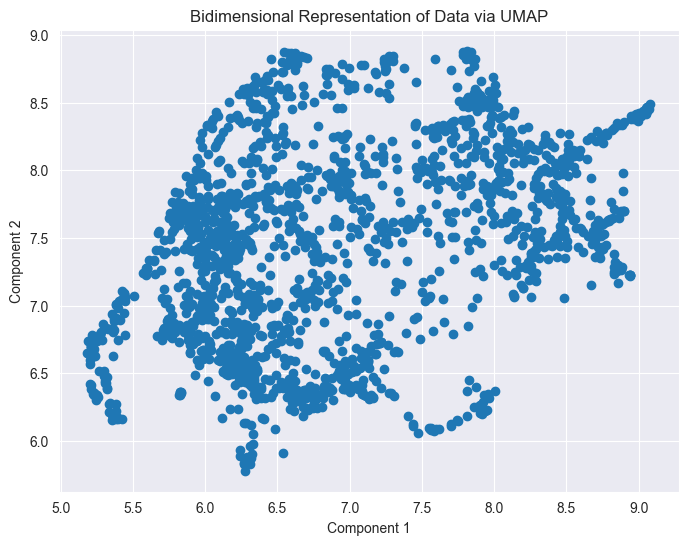

CPU times: total: 11.5 s
Wall time: 11.8 s


In [112]:
%%time
from umap import UMAP
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Create dummy data: 100 samples with 10 features each
data = np.random.rand(100, 10)
# Use our text embeddings
data = embeddings

# Initialize UMAP model with specified parameters
umap_model = UMAP(n_neighbors  = 15,
                  n_components = 5,
                  min_dist     = 0.0,
                  metric       = 'cosine',
                  random_state = 123456  # ensures reproducibility
                  )

# Fit the model to the data and transform it
'''
We need to train our reducer, letting it learn about the manifold. For this UMAP has a method <u>*fit*</u> which we pass the data we want the model to learn from. Since, at the end of the day, we are going to use the reduced representation of the data, we will use, instead, the <u>*fit_transform*</u> method which first calls fit and then returns the transformed data as a numpy array.
'''
reduced_embeddings = umap_model.fit_transform(data)


# Plot the bidimensional data
def plot_umap(reduced_embeddings):
    plt.figure(figsize=(8, 6))
    plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1])
    plt.title('Bidimensional Representation of Data via UMAP')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.show()


# Embeddings now contains the n-dimensional representation of the input data
display(pd.DataFrame(data)[:5])
display(pd.DataFrame(reduced_embeddings)[:5])

plot_umap(reduced_embeddings)

| Parameter      | Description                                                                                          |
|----------------|------------------------------------------------------------------------------------------------------|
| n_neighbors    | Controls the balance between local and global structure in the data for UMAP algorithm.                |
| min_dist       | Controls how closely UMAP is allowed to pack data points together in the low dimensional representation.|
| n_components   | Determines the dimensionality of the reduced dimension space for embedding the data in UMAP algorithm. |


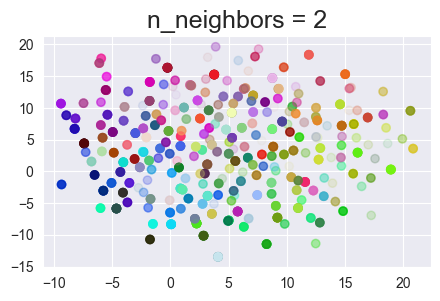

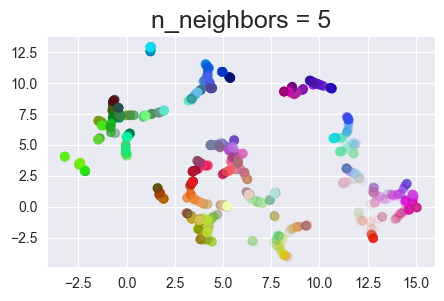

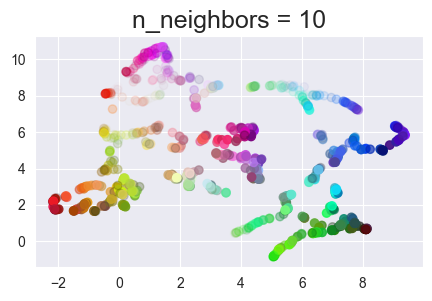

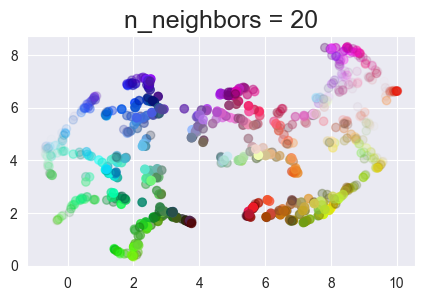

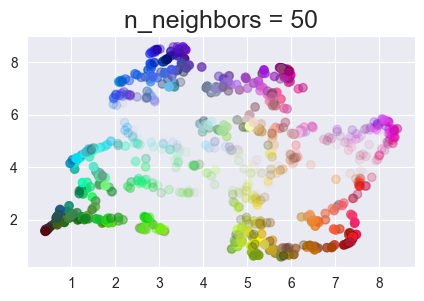

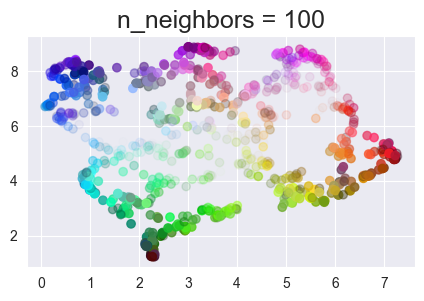

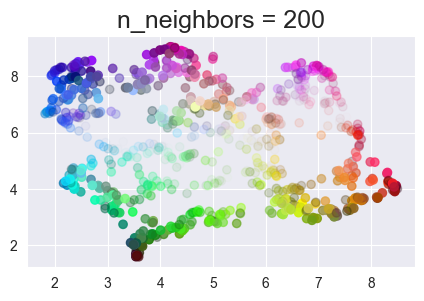

In [103]:
def apply_plot_umap(n_neighbors=15, min_dist=0.0, n_components=2, metric='cosine', title=''):
    fit = UMAP(n_neighbors  = n_neighbors,
               n_components = n_components,
               min_dist     = min_dist,
               metric       = metric,
               random_state = 123456)
    
    np.random.seed(42)
    data = np.random.rand(800, 4)  # trial with random data
    #data = embeddings[:,0:4]
    #data = np.abs(embeddings[:, 0:4])
    
    u = fit.fit_transform(data)
    
    fig = plt.figure(figsize=(5, 3))
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=data)
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=data)
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=data, s=100)

    plt.title(title, fontsize=18)
    plt.show()
    return u

for n in (2, 5, 10, 20, 50, 100, 200):
    u = apply_plot_umap(n_neighbors=n, n_components=2, title='n_neighbors = {}'.format(n))

### Apply to BERTopic model

In [104]:
# Step 2 - Reduce dimensionality

from umap import UMAP
# Using uniform manifold approximation and projection (UMAP) to reduce the dimension of embeddings
umap_model = UMAP(n_neighbors  = 15, # 15 default
                  n_components = 5,  # 5 default
                  min_dist     = 0.0,
                  metric       = 'cosine',
                  random_state = 123456) # default:None --> ensures reproducibility

topic_model = BERTopic(umap_model = umap_model,
                       embedding_model = embedding_model
                       )
topic_model_umap = topic_model.fit(docs_preprocessed, 
                                   embeddings=embeddings # recycling previously generated embeddings
                                   ) 

get_topic_info(topic_model_umap)

Topic  Count                                   Name  \
0      -1    703           -1_network_gene_protein_data   
1       0    110           0_drug_predict_target_effect   
2       1     89              1_mirna_lncrna_mir_diseas   
3       2     78           2_protein_structur_dock_bind   
4       3     68          3_graph_queri_social_subgraph   
5       4     66             4_extract_text_task_system   
6       5     49          5_ppi_protein_complex_network   
7       6     48                    6_covid_19_cov_sars   
8       7     41           7_diseas_gene_associ_disease   
9       8     39         8_extract_ppi_protein_interact   
10      9     34    9_model_network_biomolecular_design   
11     10     34           10_link_predict_network_node   
12     11     34              11_go_similar_term_semant   
13     12     33            12_cancer_sl_lethal_predict   
14     13     29             13_gene_analysi_pathway_oa   
15     14     28   14_metabol_pathway_metabolit_analysi   
16     15     27              15_model_sbol_data_system   
17     16     25     16_cluster_protein_algorithm_graph   
18     17     24       17_extract_biomed_relat_chemical   
19     18     23                18_cel_seq_single_infer   
20     19     21             19_deg_gene_express_cancer   
21     20     21            20_graph_node_learn_network   
22     21     20         21_gene_ontolog_function_annot   
23     22     19             22_diabet_t2dm_insulin_t1d   
24     23     18           23_ppi_protein_graph_predict   
25     24     18        24_plant_arabidopsi_gene_stress   
26     25     18        25_ligand_dock_inhibitor_screen   
27     26     17            26_data_lynx_databas_access   
28     27     16            27_databas_data_queri_neo4j   
29     28     14        28_sequenc_deep_protein_predict   
30     29     14      29_knowledg_graph_statement_learn   
31     30     14        30_bayesian_dbn_gene_regulatori   
32     31     14      31_tf_regulatori_transcript_regul   
33     32     12  32_hcc_hepatocellular_carcinoma_liver   

                                                                              Representation  \
0              [network, gene, protein, data, use, interact, predict, biolog, method, graph]   
1              [drug, predict, target, effect, graph, side, learn, diseas, method, interact]   
2               [mirna, lncrna, mir, diseas, associ, circrna, rna, microrna, predict, ncrna]   
3                  [protein, structur, dock, bind, score, acid, ptm, residu, amino, potenti]   
4               [graph, queri, social, subgraph, commun, network, larg, effici, data, match]   
5              [extract, text, task, system, event, biolog, literatur, inform, result, tool]   
6         [ppi, protein, complex, network, detect, align, interact, data, algorithm, commun]   
7                   [covid, 19, cov, sars, host, viral, protein, infect, pathogen, interact]   
8                     [diseas, gene, associ, disease, disord, phenotyp, gwa, gen, data, use]   
9          [extract, ppi, protein, interact, featur, literatur, method, biomed, deep, model]   
10     [model, network, biomolecular, design, system, behaviour, part, genet, biolog, logic]   
11          [link, predict, network, node, social, method, real, structur, algorithm, world]   
12                   [go, similar, term, semant, measur, ontolog, annot, gene, protein, two]   
13                  [cancer, sl, lethal, predict, tumor, graph, gene, driver, synthet, cell]   
14        [gene, analysi, pathway, oa, signal, potenti, identifi, osteoporosi, enrich, drug]   
15  [metabol, pathway, metabolit, analysi, reaction, metabolom, model, mtb, data, terpenoid]   
16              [model, sbol, data, system, biolog, ontolog, design, languag, owl, standard]   
17   [cluster, protein, algorithm, graph, complex, nois, function, interact, attribut, data]   
18            [extract, biomed, relat, chemical, task, model, entiti, neural, text, syntact]   
19                

In [106]:
%%time
topic_model_umap.visualize_documents(docs_preprocessed, embeddings=embeddings, sample= 0.1) # sample of 1% of documents 

CPU times: total: 10.1 s
Wall time: 5.68 s


Although UMAP works quite well in BERTopic and is typically advised, you might want to be using **PCA** instead. It can be faster to train and perform inference. To use PCA, we can simply import it from sklearn and pass it to the umap_model parameter:

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.064610,-0.061312,-0.019636,0.028154,-0.020033,0.002011,-0.059729,0.087289,-0.080700,-0.011586,...,0.080715,0.004480,-0.036225,-0.030062,0.000459,0.030467,-0.031904,-0.025234,-0.035746,-0.014243
1,-0.017962,-0.025276,0.020937,-0.099910,-0.013101,-0.051643,-0.036445,0.112119,0.001286,-0.048896,...,-0.019104,-0.031676,-0.056267,-0.034682,0.044367,0.000571,0.078957,0.007612,-0.039815,-0.001559
2,-0.031319,0.026182,-0.053463,-0.069562,-0.049451,-0.076996,-0.048083,0.050435,-0.068096,0.040404,...,-0.029357,0.045164,-0.071966,0.052727,0.055970,0.011457,0.085220,-0.014480,-0.022986,-0.068206
3,-0.070093,-0.013811,-0.026144,-0.128657,0.004056,-0.035542,-0.071773,0.106041,0.007793,0.023432,...,-0.046915,0.022225,-0.091111,-0.015433,0.068406,-0.002029,0.086313,-0.066145,0.002774,-0.025725
4,-0.006125,-0.005627,-0.031582,-0.090776,0.011282,-0.064993,0.023937,0.108380,0.008570,-0.011619,...,-0.003076,0.036413,-0.049299,-0.000758,0.022773,0.032360,0.103344,-0.047649,-0.004513,-0.040509


,0,1,2,3,4
0,0.458794,0.179758,0.256527,0.061185,-0.016738
1,0.033644,0.060005,-0.118744,0.205668,-0.142240
2,0.169017,-0.235863,0.061432,-0.153148,-0.119699
3,0.139607,0.004324,-0.028862,0.034362,-0.035272
4,-0.018495,-0.103554,0.008618,0.086658,-0.020381


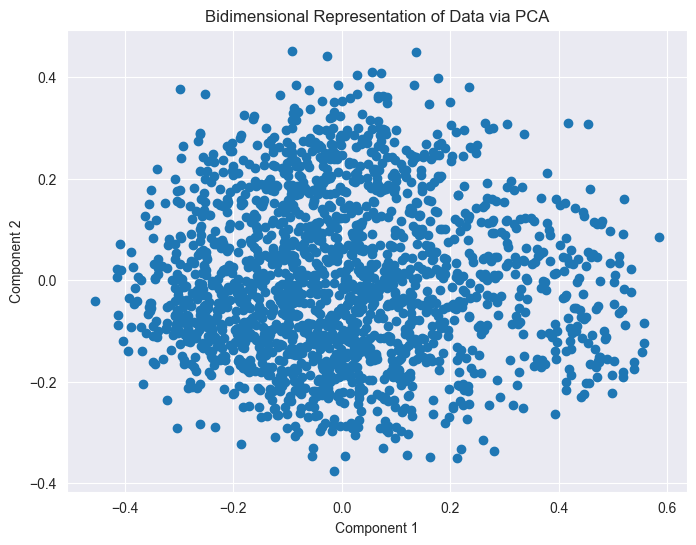

In [107]:
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Create dummy data: 100 samples with 10 features each
# data = np.random.rand(100, 10)
data = embeddings

# Initialize PCA model with specified parameters
dim_model = PCA(n_components=5)

# Fit the model to the data and transform it
reduced_embeddings_pca = dim_model.fit_transform(data)

# embedding now contains the 5-dimensional representation of the input data
display(pd.DataFrame(data)[:5])
display(pd.DataFrame(reduced_embeddings_pca)[:5])


# Plot the bidimensional data
plt.figure(figsize=(8, 6))
plt.scatter(reduced_embeddings_pca[:, 0], reduced_embeddings_pca[:, 1])
plt.title('Bidimensional Representation of Data via PCA')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()
###

In [108]:
from sklearn.decomposition import PCA

dim_model = PCA(n_components=5)

topic_model = BERTopic(umap_model = dim_model,
                       embedding_model = embedding_model
                       )
topic_model_pca = topic_model.fit(docs_preprocessed, embeddings=embeddings)

get_topic_info(topic_model_pca)

Topic  Count                                 Name  \
0     -1   1252  -1_protein_network_interact_predict   
1      0    508           0_gene_protein_network_use   
2      1     42         1_graph_queri_network_social   
3      2     16          2_network_link_predict_node   

                                                                           Representation  \
0            [protein, network, interact, predict, graph, use, data, model, gene, method]   
1        [gene, protein, network, use, data, interact, analysi, diseas, function, method]   
2      [graph, queri, network, social, commun, vertex, subgraph, algorithm, data, effici]   
3  [network, link, predict, node, graph, hypergraph, embed, techniqu, structur, interact]   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

In [109]:
topic_model_pca.visualize_documents(docs_preprocessed, embeddings=embeddings, sample= 0.1)

Skip dimensionality reduction
Although BERTopic applies dimensionality reduction as a default in its pipeline, this is a step that you might want to skip. We generate an "empty" model that simply returns the data pass it to:

In [110]:
from bertopic.dimensionality import BaseDimensionalityReduction

# Fit BERTopic without actually performing any dimensionality reduction
empty_dimensionality_model = BaseDimensionalityReduction()

topic_model = BERTopic(umap_model=empty_dimensionality_model,
                       embedding_model = embedding_model
                       )
topic_model_base = topic_model.fit(docs_preprocessed, embeddings=embeddings)

get_topic_info(topic_model_base)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1818,-1_protein_network_gene_interact,"[protein, network, gene, interact, use, data, predict, graph, method, model]","[priorit candid diseas gene combin topolog similar semant similar $ identif gene-phenotyp relationship import treatment human diseas . studi shown gene caus similar phenotyp tend interact protein-protein interact ( ppi ) network . thu , mani identif method base ppi network model achiev good result . howev , ppi network , interact protein encod candid gene protein encod known diseas gene weak . therefor , studi combin ppi network genom inform report good predict perform . howev , believ result could improv . paper , propos new method use semant similar candid gene known diseas gene set initi probabl vector random walk restart algorithm human ppi network . effect method demonstr leave-one-out cross-valid , experiment result indic method outperform method . addit , method predict new caus gene multifactor diseas , includ parkinson 's diseas , breast cancer obes . top predict good consist find literatur , illustr effect method . © 2015 elsevi inc .., graph featur auto-encod predict unobserv node featur biolog network $ background : molecular interact network summar complex biolog process graph , whose structur inform biolog function multipl scale . simultan , omic technolog measur variat activ gene , protein , metabolit across individu experiment condit . integr complementari viewpoint biolog network omic data import task bioinformat , exist method treat network discret structur , intrins difficult integr continu node featur activ measur . graph neural network map graph node low-dimension vector space represent , train preserv local graph structur similar node featur . result : studi represent transcript , protein–protein genet interact network e. coli mous use graph neural network . found represent explain larg proport variat gene express data , use gene express data node featur improv reconstruct graph embed . propos new end-to-end graph featur auto-encod framework predict node featur util structur gene network , train featur predict task , show perform better predict unobserv node featur regular multilay perceptron . appli problem imput miss data single-cel rnaseq data , graph featur auto-encod util new graph convolut layer call featgraphconv outperform state-of-the-art imput method use protein interact inform , show benefit integr biolog network omic data propos approach . conclus : propos graph featur auto-encod framework power approach integr exploit close relat molecular interact network function genom data . © 2021 , author ( ) ., implement link predict protein network via featur fusion model base graph neural network $ motiv : protein-protein interact serv cornerston variou biochem process within biolog organ . exist research methodolog predominantli employ link predict techniqu analyz interact network . howev , tradit approach often fall short deliv satisfactori predict perform appli multi-speci dataset . current comput method larg focu analyz network topolog , result somewhat monolith featur set . integr divers featur model could potenti yield superior perform broader applic . end , propos autoencod model built graph neural network , design enhanc predict perform generaliz leverag integr gene ontolog . result : research , develop agraphsag , model specif design analyz protein-protein interact network data . seamlessli integr gene ontolog graph structur , employ dual-channel graph sampl aggreg network capit topolog inform process high-dimension featur . featur fusion achiev implement graph attent mechan , adopt link predict framework experiment train model . perform evalu real-world dataset use key metric , area curv ( auc ) . hyperparamet search space establish , bayesian optim strategi appli iter fine-tun model , assess impact variou paramet predict efficaci . experiment result valid propos model capabl effect predict protein-protein interact acr

## 3. Hierarchical Clustering

**HDBSCAN** (*hierarchical density-based spatial clustering of applications with Noise*) is used to generate semantically similar document clusters. 
Since HDBSCAN is a density-based clustering algorithm, the number of clusters is automatically chosen based on the minimum distance to be considered as a neighbor.
 
Read the Docs: https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html

In [111]:
from sklearn.datasets import make_blobs
pd.DataFrame(reduced_embeddings).head()

,0,1,2,3,4
0,0.458794,0.179758,0.256527,0.061185,-0.016738
1,0.033644,0.060005,-0.118744,0.205668,-0.142240
2,0.169017,-0.235863,0.061432,-0.153148,-0.119699
3,0.139607,0.004324,-0.028862,0.034362,-0.035272
4,-0.018495,-0.103554,0.008618,0.086658,-0.020381


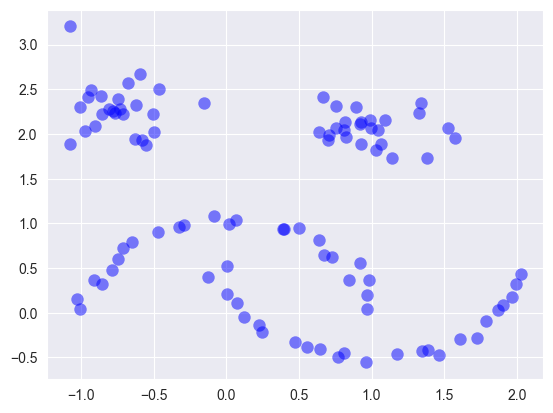

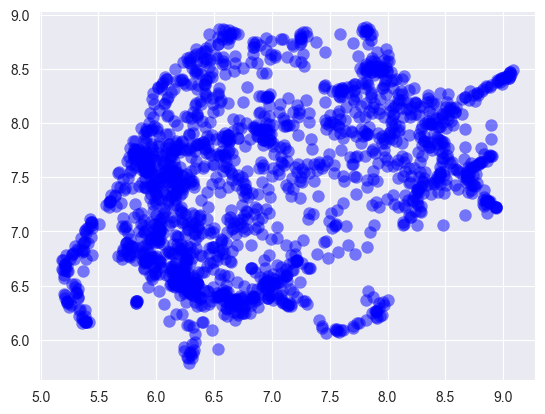

In [143]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.datasets as data
plot_kwds = {'alpha' : 0.5, 's' : 80, 'linewidths':0}

# Generate simple test data
moons, _ = data.make_moons(n_samples=50, noise=0.05)
blobs, _ = data.make_blobs(n_samples=50, centers=[(-0.75,2.25), (1.0, 2.0)], cluster_std=0.25)
simple_test_data = np.vstack([moons, blobs])

plt.scatter(simple_test_data[:, 0], simple_test_data[:, 1], color='b', **plot_kwds)
plt.show()

# Get test data from our embeddings
sample = len(reduced_embeddings)
component_1 = reduced_embeddings[:sample, 0]  #sample 100 
component_2 = reduced_embeddings[:sample, 1]  #sample 100
test_data_emb   = reduced_embeddings[:sample, 0:5]  # choose test data dimensinality [0:1-5]

plt.scatter(component_1, component_2, color='b', **plot_kwds)
plt.show()

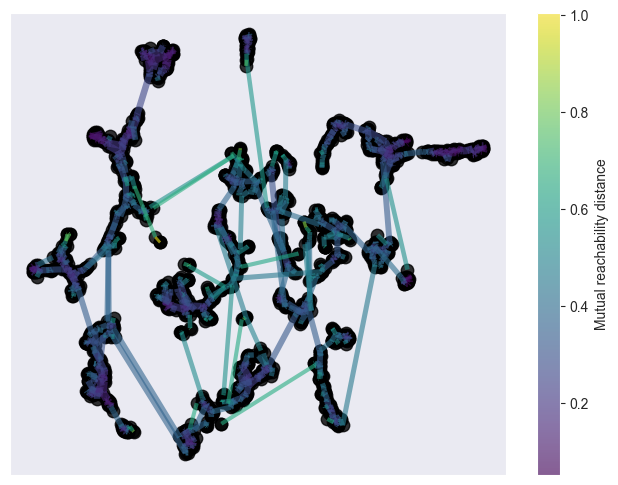

In [144]:
import hdbscan
test_data = simple_test_data
test_data = test_data_emb

#clusterer = hdbscan.HDBSCAN(min_cluster_size=15, 
#                            gen_min_span_tree=True)
clusterer = hdbscan.HDBSCAN(min_cluster_size=10, # 10 default
                            metric='euclidean',
                            cluster_selection_method='eom',
                            prediction_data=False,
                            gen_min_span_tree=True)

clusterer.fit(test_data)

plt.figure(figsize=(8, 6))
clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                      edge_alpha=0.6,
                                      node_size=80,
                                      edge_linewidth=2)
plt.show()

Single Linkage Tree


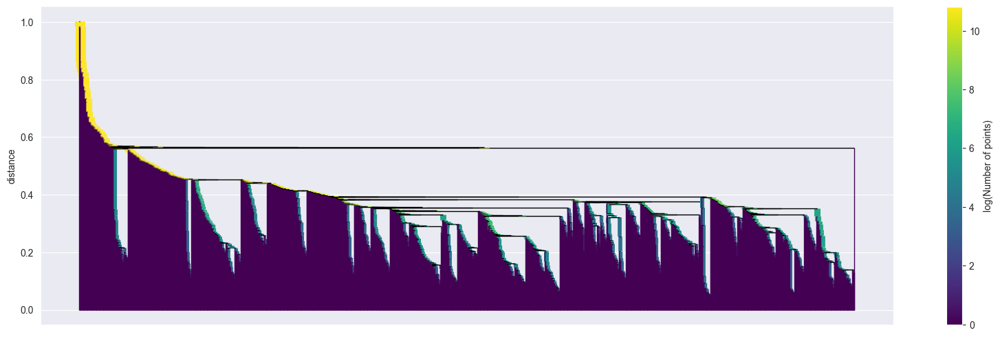

Condensed Tree


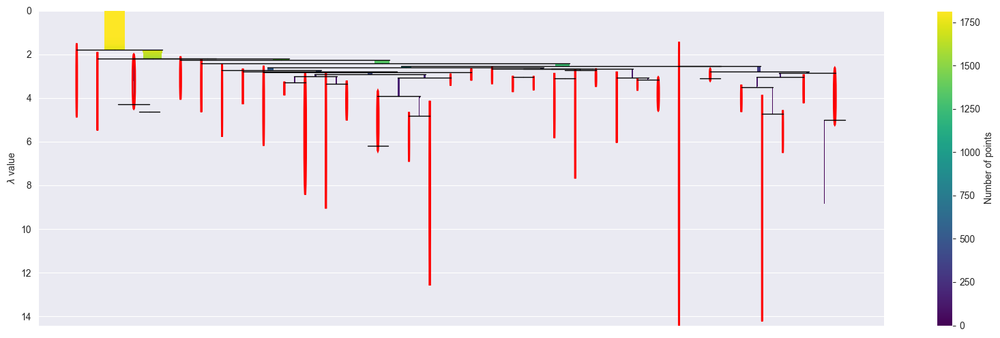

In [148]:
# The algorithm builds a complete dendrogram, accessible through the "single_linkage_tree_" attribute
print('Single Linkage Tree')
plt.figure(figsize=(20, 6))
clusterer.single_linkage_tree_.plot(cmap='viridis', colorbar=True)
plt.show()

# We can access the basic hierarchy via the "condensed_tree_" attribute of the clusterer object.
print('Condensed Tree')
plt.figure(figsize=(20, 6))
clusterer.condensed_tree_.plot(select_clusters=True, 
                               selection_palette=sns.color_palette())
plt.show()

The number of clusters detected corresponds to the number of topics by BERTopic

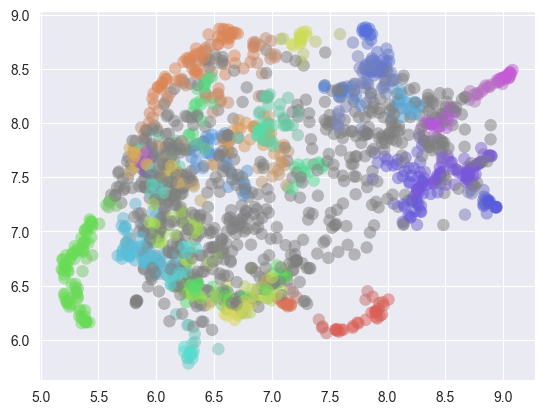

In [150]:
# Highlight Clusters
palette = sns.color_palette("hls", 40) # define color palette

cluster_colors = [sns.desaturate(palette[col], sat)
                  if col >= 0 else (0.5, 0.5, 0.5) for col, sat in
                  zip(clusterer.labels_, clusterer.probabilities_)]

plt.scatter(test_data[:, 0], test_data[:, 1], c=cluster_colors, **plot_kwds)
plt.show()

### Apply to BERTopic model

In [168]:
from hdbscan.hdbscan_ import HDBSCAN

# Find the optimal number of clusters with HDBscan
# Application: removing Noise
""" HDBSCAN: Hierarchical Density-Based Spatial Clustering of Applications with Noise """

hdbscan_model = HDBSCAN(min_cluster_size=10,   #BERTopic(min_topic_size = 10) #default
                        metric='euclidean', 
                        cluster_selection_method='eom', 
                        prediction_data=False)

topic_model = BERTopic(hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model = embedding_model)

topic_model_hdbscan = topic_model.fit(docs_preprocessed, embeddings)

get_topic_info(topic_model_hdbscan)

Topic  Count                                   Name  \
0      -1    703           -1_network_gene_protein_data   
1       0    110           0_drug_predict_target_effect   
2       1     89              1_mirna_lncrna_mir_diseas   
3       2     78           2_protein_structur_dock_bind   
4       3     68          3_graph_queri_social_subgraph   
5       4     66             4_extract_text_task_system   
6       5     49          5_ppi_protein_complex_network   
7       6     48                    6_covid_19_cov_sars   
8       7     41           7_diseas_gene_associ_disease   
9       8     39         8_extract_ppi_protein_interact   
10      9     34    9_model_network_biomolecular_design   
11     10     34           10_link_predict_network_node   
12     11     34              11_go_similar_term_semant   
13     12     33            12_cancer_sl_lethal_predict   
14     13     29             13_gene_analysi_pathway_oa   
15     14     28   14_metabol_pathway_metabolit_analysi   
16     15     27              15_model_sbol_data_system   
17     16     25     16_cluster_protein_algorithm_graph   
18     17     24       17_extract_biomed_relat_chemical   
19     18     23                18_cel_seq_single_infer   
20     19     21             19_deg_gene_express_cancer   
21     20     21            20_graph_node_learn_network   
22     21     20         21_gene_ontolog_function_annot   
23     22     19             22_diabet_t2dm_insulin_t1d   
24     23     18           23_ppi_protein_graph_predict   
25     24     18        24_plant_arabidopsi_gene_stress   
26     25     18        25_ligand_dock_inhibitor_screen   
27     26     17            26_data_lynx_databas_access   
28     27     16            27_databas_data_queri_neo4j   
29     28     14        28_sequenc_deep_protein_predict   
30     29     14      29_knowledg_graph_statement_learn   
31     30     14        30_bayesian_dbn_gene_regulatori   
32     31     14      31_tf_regulatori_transcript_regul   
33     32     12  32_hcc_hepatocellular_carcinoma_liver   

                                                                              Representation  \
0              [network, gene, protein, data, use, interact, predict, biolog, method, graph]   
1              [drug, predict, target, effect, graph, side, learn, diseas, method, interact]   
2               [mirna, lncrna, mir, diseas, associ, circrna, rna, microrna, predict, ncrna]   
3                  [protein, structur, dock, bind, score, acid, ptm, residu, amino, potenti]   
4               [graph, queri, social, subgraph, commun, network, larg, effici, data, match]   
5              [extract, text, task, system, event, biolog, literatur, inform, result, tool]   
6         [ppi, protein, complex, network, detect, align, interact, data, algorithm, commun]   
7                   [covid, 19, cov, sars, host, viral, protein, infect, pathogen, interact]   
8                     [diseas, gene, associ, disease, disord, phenotyp, gwa, gen, data, use]   
9          [extract, ppi, protein, interact, featur, literatur, method, biomed, deep, model]   
10     [model, network, biomolecular, design, system, behaviour, part, genet, biolog, logic]   
11          [link, predict, network, node, social, method, real, structur, algorithm, world]   
12                   [go, similar, term, semant, measur, ontolog, annot, gene, protein, two]   
13                  [cancer, sl, lethal, predict, tumor, graph, gene, driver, synthet, cell]   
14        [gene, analysi, pathway, oa, signal, potenti, identifi, osteoporosi, enrich, drug]   
15  [metabol, pathway, metabolit, analysi, reaction, metabolom, model, mtb, data, terpenoid]   
16              [model, sbol, data, system, biolog, ontolog, design, languag, owl, standard]   
17   [cluster, protein, algorithm, graph, complex, nois, function, interact, attribut, data]   
18            [extract, biomed, relat, chemical, task, model, entiti, neural, text, syntact]   
19                

By reducing the minimum cluster size, I obtain a much larger number of clusters and thus topics

In [152]:
hdbscan_model_ = HDBSCAN(min_cluster_size=5,   #BERTopic(min_topic_size = 10) #default
                        metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=False)

topic_model = BERTopic(hdbscan_model=hdbscan_model_,
                       umap_model=umap_model,
                       embedding_model = embedding_model)

topic_model_hdbscan = topic_model.fit(docs_preprocessed, embeddings)

get_topic_info(topic_model_hdbscan)

Topic  Count                                       Name  \
0      -1    669                -1_gene_network_protein_use   
1       0     66               0_structur_protein_dock_bind   
2       1     49                1_ppi_complex_protein_align   
3       2     44                  2_mirna_microrna_mrna_mir   
4       3     43                   3_cancer_sl_driver_tumor   
..    ...    ...                                        ...   
62     61      5  61_cinobufotalin_androgen_osteosarcoma_ms   
63     62      5              62_pathogen_host_mimicri_rod9   
64     63      5            63_ontolog_onto2vec_axiom_popul   
65     64      5             64_complex_protein_mke_subunit   
66     65      5                65_cpi_higppim_iga_compound   

                                                                                  Representation  \
0                 [gene, network, protein, use, interact, data, biolog, predict, method, diseas]   
1                       [structur, protein, dock, bind, score, residu, amino, acid, atom, affin]   
2          [ppi, complex, protein, align, detect, network, interact, algorithm, similar, commun]   
3                  [mirna, microrna, mrna, mir, target, diseas, associ, regul, express, biomark]   
4                      [cancer, sl, driver, tumor, lethal, gene, predict, graph, synthet, sampl]   
..                                                                                           ...   
62       [cinobufotalin, androgen, osteosarcoma, ms, calcium, synapt, surf4, ca2, camkii, psd95]   
63  [pathogen, host, mimicri, rod9, hpi, ppi, enteropathogen, salmonella, protein, arapathogen2]   
64         [ontolog, onto2vec, axiom, popul, mowl, vector, ontology, entiti, biomolecular, erbk]   
65  [complex, protein, mke, subunit, motif, supernod, kernel, substructur, algorithm, clusterbf]   
66                   [cpi, higppim, iga, compound, mtl, graph, granular, molecular, learn, ppim]   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

## 4. Topic Tokenization

In topic modeling, the quality of the topic representations is key for interpreting the topics, communicating results, and understanding patterns. It is of utmost importance to make sure that the topic representations fit with your use case.

### CountVectorizer

CountVectorizer operates by tokenizing the text data and counting the occurrences of each token. It then creates a matrix where the rows represent the documents, and the columns represent the tokens. The cell values indicate the frequency of each token in each document. This matrix is known as the “document-term matrix.”

In the example, the fit_transform method of CountVectorizer both fits the vectorizer to the documents (learns the vocabulary) and transforms the documents into a document-term matrix. The resulting matrix represents the frequency of each token in each document.

https://spotintelligence.com/2023/05/17/countvectorizer/#:~:text=CountVectorizer%20is%20a%20text%20preprocessing,machine%20learning%20library%20in%20Python.

In [158]:
from sklearn.feature_extraction.text import CountVectorizer

corpus = [
    'This is the first document.',
    'This document is the second document.',
    'And this is the third one.',
    'Is this the first document?',
]

# Create an instance of CountVectorizer
vectorizer = CountVectorizer()

# Fit the vectorizer to the documents and transform the documents into a document-term matrix
X = vectorizer.fit_transform(corpus)

# Get the feature names (tokens)
feature_names = vectorizer.get_feature_names_out()

print('Feature names:')
print(feature_names, '\n')

print('Document-term matrix:')
print(X.toarray())

Feature names
['and' 'document' 'first' 'is' 'one' 'second' 'the' 'third' 'this'] 

Document-term matrix
[[0 1 1 1 0 0 1 0 1]
 [0 2 0 1 0 1 1 0 1]
 [1 0 0 1 1 0 1 1 1]
 [0 1 1 1 0 0 1 0 1]]


In [164]:
# Set ngrams:
vectorizer = CountVectorizer(ngram_range=(2, 2))
X = vectorizer.fit_transform(corpus)
feature_names = vectorizer.get_feature_names_out()

print('Feature names:')
print(feature_names, '\n')
print('Document-term matrix:')
print(X.toarray())

Feature names:
['and this' 'document is' 'first document' 'is the' 'is this'
 'second document' 'the first' 'the second' 'the third' 'third one'
 'this document' 'this is' 'this the'] 

Document-term matrix:
[[0 0 1 1 0 0 1 0 0 0 0 1 0]
 [0 1 0 1 0 1 0 1 0 0 1 0 0]
 [1 0 0 1 0 0 0 0 1 1 0 1 0]
 [0 0 1 0 1 0 1 0 0 0 0 0 1]]


In [161]:
# Remove Stopwords
vectorizer = CountVectorizer(stop_words="english")
X = vectorizer.fit_transform(corpus)
feature_names = vectorizer.get_feature_names_out()

print('Feature names:')
print(feature_names, '\n')
print('Document-term matrix:')
print(X.toarray())

Feature names:
['document' 'second'] 

Document-term matrix:
[[1 0]
 [2 1]
 [0 0]
 [1 0]]


### Apply to BERTopic model

In [169]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

# Train BERTopic with a custom CountVectorizer
vectorizer_model = CountVectorizer(min_df=10,
                                   ngram_range=(1, 1),
                                   stop_words="english")

topic_model = BERTopic(vectorizer_model=vectorizer_model,
                       hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model = embedding_model
                       )

# Apply custom Vectorizer model on un-processed docs 
topic_model_vector = topic_model.fit(docs, embeddings_docs) 
#topic_model_vector = topic_model.fit(docs_preprocessed, embeddings)

get_topic_info(topic_model_vector)

Topic  Count                                       Name  \
0      -1    582                 -1_data_gene_genes_network   
1       0    113     0_protein_binding_structural_structure   
2       1     97           1_link_networks_graph_prediction   
3       2     81                2_graph_graphs_query_social   
4       3     75   3_extraction_biomedical_relation_protein   
5       4     74           4_mirna_disease_associations_rna   
6       5     68           5_drug_prediction_learning_graph   
7       6     68               6_disease_genes_gene_genetic   
8       7     49           7_systems_networks_biology_parts   
9       8     47         8_genes_cancer_expression_analysis   
10      9     44         9_complexes_protein_clustering_ppi   
11     10     43       10_extraction_text_mining_literature   
12     11     42          11_similarity_terms_semantic_gene   
13     12     41                12_19_proteins_host_protein   
14     13     40               13_data_systems_models_model   
15     14     35           14_metabolic_analysis_omics_data   
16     15     31       15_cancer_prediction_synthetic_omics   
17     16     30          16_genes_analysis_drugs_potential   
18     17     29        17_bayesian_regulatory_gene_network   
19     18     28             18_data_database_string_genome   
20     19     27        19_sequence_protein_deep_prediction   
21     20     25  20_knowledge_semantic_entities_similarity   
22     21     24               21_plant_stress_species_gene   
23     22     19         22_genes_diabetes_analysis_related   
24     23     19       23_visualization_maps_data_cytoscape   
25     24     17          24_drug_causal_platform_knowledge   
26     25     17                    25_cell_single_seq_gene   
27     26     15                 26_drug_drugs_effects_text   
28     27     14           27_ppi_conserved_network_species   
29     28     12              28_cancer_data_omics_database   
30     29     12        29_sites_post_translational_protein   

                                                                                           Representation  \
0                   [data, gene, genes, network, protein, based, networks, biological, disease, analysis]   
1    [protein, binding, structural, structure, scoring, structures, based, proteins, interactions, amino]   
2                     [link, networks, graph, prediction, network, node, embedding, nodes, links, social]   
3                     [graph, graphs, query, social, networks, subgraph, data, queries, community, large]   
4        [extraction, biomedical, relation, protein, model, interaction, literature, ppi, text, learning]   
5    [mirna, disease, associations, rna, diseases, network, interactions, target, similarity, prediction]   
6                     [drug, prediction, learning, graph, drugs, target, deep, methods, protein, network]   
7               [disease, genes, gene, genetic, diseases, association, associated, variants, data, using]   
8                  [systems, networks, biology, parts, model, genetic, models, complex, design, reaction]   
9       [genes, cancer, expression, analysis, identified, hub, patients, survival, associated, expressed]   
10      [complexes, protein, clustering, ppi, complex, algorithm, detection, networks, algorithms, based]   
11    [extraction, text, mining, literature, information, task, biological, scientific, systems, extract]   
12            [similarity, terms, semantic, gene, ontology, measures, measure, protein, term, functional]   
13                  [19, proteins, host, protein, human, analysis, cell, binding, potential, interaction]   
14              [data, systems, models, model, ontology, biology, semantic, web, biological, integration]   
15             [metabolic, analysis, omics, data, conditions, knowledge, growth, genome, systems, models]   
16                       [cancer, prediction, synthetic, omics, graph, gene, methods, data, multi, based]   
17           [genes, anal

It is possible to fine-tune topic representations even after training the BERTopic model.

In [179]:
topic_model = BERTopic(hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model = embedding_model
                       )
topic_model_base = topic_model.fit(docs, embeddings=embeddings_docs)
get_topic_info(topic_model_base)

Topic  Count                                       Name  \
0      -1    582                           -1_the_of_and_to   
1       0    113                   0_protein_the_of_binding   
2       1     97              1_link_networks_graph_network   
3       2     81                   2_graph_graphs_query_and   
4       3     75       3_extraction_biomedical_relation_the   
5       4     74                     4_mirna_mirnas_the_and   
6       5     68             5_drug_the_prediction_learning   
7       6     68                     6_disease_genes_and_of   
8       7     49              7_of_the_biomolecular_systems   
9       8     47                       8_genes_were_hcc_and   
10      9     44         9_complexes_protein_ppi_clustering   
11     10     43                  10_text_extraction_the_of   
12     11     42            11_go_similarity_terms_semantic   
13     12     41                       12_covid_sars_19_cov   
14     13     40                         13_data_and_to_the   
15     14     35                    14_metabolic_of_and_the   
16     15     31                15_sl_cancer_prediction_the   
17     16     30                      16_genes_were_and_was   
18     17     29        17_regulatory_bayesian_network_gene   
19     18     28                    18_data_and_database_to   
20     19     27         19_sequence_protein_prediction_the   
21     20     25  20_knowledge_semantic_similarity_entities   
22     21     24               21_plant_and_the_arabidopsis   
23     22     19                 22_genes_diabetic_and_were   
24     23     19              23_visualization_data_and_the   
25     24     17                   24_drug_knowledge_and_to   
26     25     17                   25_cell_single_seq_scrna   
27     26     15                 26_drug_drugs_side_effects   
28     27     14         27_alignment_ppi_network_conserved   
29     28     12                      28_cancer_data_and_of   
30     29     12        29_ptm_phosphorylation_ptms_protein   

                                                                                   Representation  \
0                                                 [the, of, and, to, in, for, we, data, gene, is]   
1                        [protein, the, of, binding, and, docking, to, in, structure, structural]   
2                      [link, networks, graph, network, prediction, the, node, of, in, embedding]   
3                                 [graph, graphs, query, and, in, the, social, of, networks, for]   
4                      [extraction, biomedical, relation, the, protein, and, in, to, from, model]   
5                            [mirna, mirnas, the, and, disease, lncrna, associations, of, to, in]   
6                             [drug, the, prediction, learning, of, and, graph, to, for, protein]   
7                                           [disease, genes, and, of, gene, the, to, in, for, ad]   
8                               [of, the, biomolecular, systems, to, and, is, this, in, networks]   
9                                   [genes, were, hcc, and, cancer, the, of, expression, in, was]   
10            [complexes, protein, ppi, clustering, the, of, complex, algorithm, based, networks]   
11                                    [text, extraction, the, of, and, for, mining, in, to, from]   
12                       [go, similarity, terms, semantic, gene, ontology, the, measures, of, to]   
13                                      [covid, sars, 19, cov, and, the, of, virus, proteins, in]   
14                                      [data, and, to, the, of, models, systems, model, in, for]   
15                            [metabolic, of, and, the, to, analysis, in, data, omics, knowledge]   
16                          [sl, cancer, prediction, the, to, driver, synthetic, of, gene, graph]   
17                               [genes, were, and, was, analysis, the, drugs, potential, oa, of]   
18                  [regulatory, bayesian, network, gene, the, of, i

In [180]:
# Fine-tune topic representations after training BERTopic
vectorizer_model = CountVectorizer(stop_words="english", 
                                   ngram_range=(1, 1), 
                                   min_df=10)

topic_model_base.update_topics(docs, vectorizer_model=vectorizer_model)
get_topic_info(topic_model_vector)

Topic  Count                                 Name  \
0      -1    703         -1_network_gene_protein_data   
1       0    110         0_drug_predict_target_effect   
2       1     89          1_diseas_associ_rna_predict   
3       2     78         2_structur_protein_dock_bind   
4       3     68        3_graph_queri_social_subgraph   
5       4     66            4_extract_text_task_event   
6       5     49        5_ppi_protein_complex_network   
7       6     48            6_19_host_infect_pathogen   
8       7     41         7_diseas_gene_associ_disease   
9       8     39       8_extract_ppi_protein_interact   
10      9     34  9_model_biomolecular_design_network   
11     10     34         10_link_predict_network_node   
12     11     34        11_similar_term_semant_measur   
13     12     33        12_cancer_tumor_predict_graph   
14     13     29       13_gene_analysi_pathway_signal   
15     14     28  14_metabol_pathway_reaction_analysi   
16     15     27         15_model_data_biolog_ontolog   
17     16     25   16_cluster_algorithm_graph_protein   
18     17     24         17_extract_biomed_relat_task   
19     18     23             18_seq_single_infer_cell   
20     19     21           19_deg_express_gene_cancer   
21     20     21           20_graph_node_learn_neural   
22     21     20       21_ontolog_gene_function_annot   
23     22     19         22_diabet_common_gene_signal   
24     23     18         23_ppi_protein_graph_predict   
25     24     18       24_plant_arabidopsi_gene_speci   
26     25     18          25_dock_virtual_screen_site   
27     26     17           26_data_access_databas_web   
28     27     16         27_databas_data_queri_biolog   
29     28     14       28_sequenc_deep_featur_predict   
30     29     14       29_knowledg_graph_learn_semant   
31     30     14  30_bayesian_regulatori_gene_network   
32     31     14    31_tf_transcript_regulatori_regul   
33     32     12        32_gene_poor_express_progress   

                                                                                    Representation  \
0                    [network, gene, protein, data, use, interact, predict, biolog, method, graph]   
1                 [drug, predict, target, effect, graph, learn, diseas, method, interact, network]   
2                [diseas, associ, rna, predict, target, interact, cancer, express, similar, regul]   
3                   [structur, protein, dock, bind, score, acid, residu, amino, interfac, potenti]   
4                     [graph, queri, social, subgraph, commun, network, larg, effici, match, data]   
5                  [extract, text, task, event, literatur, biolog, inform, tool, scientif, result]   
6               [ppi, protein, complex, network, detect, align, interact, algorithm, commun, data]   
7                      [19, host, infect, pathogen, protein, interact, human, studi, drug, diseas]   
8                      [diseas, gene, associ, disease, disord, phenotyp, gen, ad, genet, identifi]   
9                [extract, ppi, protein, interact, featur, literatur, method, deep, biomed, model]   
10           [model, biomolecular, design, network, genet, biolog, logic, simul, complex, languag]   
11                [link, predict, network, node, social, real, structur, method, world, algorithm]   
12                [similar, term, semant, measur, ontolog, annot, gene, protein, function, method]   
13                      [cancer, tumor, predict, graph, synthet, gene, cell, method, learn, sampl]   
14                  [gene, analysi, pathway, signal, potenti, identifi, enrich, drug, deg, target]   
15           [metabol, pathway, reaction, analysi, model, data, genome, scal, integr, reconstruct]   
16                 [model, data, biolog, ontolog, design, languag, standard, semant, develop, use]   
17          [cluster, algorithm, graph, protein, complex, nois, attribut, function, interact, edg]   
18                   [extract, biomed, relat, task, model, entiti, neu

## 5. Weight tokens (c-TF-IDF)

### TfidfVectorizer
TfidfVectorizer stands for “*Term Frequency-Inverse Document Frequency Vectorizer*”. It builds upon the concept of CountVectorizer but incorporates the TF-IDF weighting scheme. TF-IDF is a numerical statistic that reflects the importance of a term (token) in a document within a larger corpus.

The TF-IDF value for a term in a document is calculated by multiplying the term frequency (TF) and inverse document frequency (IDF) components:

TF-IDF = Term Frequency (TF) * Inverse Document Frequency (IDF)

Where:
1. Term Frequency (TF) = (Number of times term appears in a document) / (Total terms in the document)
2. Inverse Document Frequency (IDF) = log((Total number of documents) / (Number of documents containing the term)) 

- Term Frequency (TF) represents the frequency of a term in a document. It is typically calculated as the count of the term in the document divided by the total number of terms in the document.
- Inverse Document Frequency (IDF) measures the rarity of a term in the corpus. It is calculated as the logarithm of the total number of documents divided by the number of documents that contain the term.


In [9]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

corpus = [
    'This is the first document.',
    'This document is the second document.',
    'And this is the third one.',
    'Is this the first document?',
]


count_vectorizer = CountVectorizer()
X_count = count_vectorizer.fit_transform(corpus)

# TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()
X_tfidf = tfidf_vectorizer.fit_transform(corpus)

# Get the feature names (tokens)
feature_names_count = count_vectorizer.get_feature_names_out()
feature_names_tfidf = tfidf_vectorizer.get_feature_names_out()

# Print the feature names
print("CountVectorizer feature names:", feature_names_count)
print("TfidfVectorizer feature names:", feature_names_tfidf)

# Print the document-term matrices
print("\nCountVectorizer document-term matrix:")
print(X_count.toarray())

print("\nTfidfVectorizer document-term matrix:")
X_tfidf.toarray()

CountVectorizer feature names: ['and' 'document' 'first' 'is' 'one' 'second' 'the' 'third' 'this']
TfidfVectorizer feature names: ['and' 'document' 'first' 'is' 'one' 'second' 'the' 'third' 'this']

CountVectorizer document-term matrix:
[[0 1 1 1 0 0 1 0 1]
 [0 2 0 1 0 1 1 0 1]
 [1 0 0 1 1 0 1 1 1]
 [0 1 1 1 0 0 1 0 1]]

TfidfVectorizer document-term matrix:


array([[0.        , 0.46979139, 0.58028582, 0.38408524, 0.        ,
        0.        , 0.38408524, 0.        , 0.38408524],
       [0.        , 0.6876236 , 0.        , 0.28108867, 0.        ,
        0.53864762, 0.28108867, 0.        , 0.28108867],
       [0.51184851, 0.        , 0.        , 0.26710379, 0.51184851,
        0.        , 0.26710379, 0.51184851, 0.26710379],
       [0.        , 0.46979139, 0.58028582, 0.38408524, 0.        ,
        0.        , 0.38408524, 0.        , 0.38408524]])

c-TF-IDF
In BERTopic, in order to get an accurate representation of the topics from our bag-of-words matrix, TF-IDF was adjusted to work on a cluster/categorical/topic level instead of a document level. This adjusted TF-IDF representation is called c-TF-IDF and takes into account what makes the documents in one cluster different from documents in another cluster
Each cluster is converted to a single document instead of a set of documents. Then, we extract the frequency of word x in class c, where c refers to the cluster we created before. This results in our class-based tf representation. 

### Apply to BERTopic model

Some words appear quite often in every topic but are generally not considered stop words as found in the CountVectorizer(stop_words="english") list. To further reduce these frequent words, we can use reduce_frequent_words to take the square root of the term frequency after applying the weighting scheme.

In [27]:
from bertopic.vectorizers import ClassTfidfTransformer

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
vectorizer_model = CountVectorizer(stop_words="english")

topic_model = BERTopic(ctfidf_model=ctfidf_model, 
                       vectorizer_model=vectorizer_model,
                       hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model = embedding_model
                       )
#topic_model_vector = topic_model.fit(docs_preprocessed, embeddings)
topic_model_vector = topic_model.fit(docs, embeddings_docs)

get_topic_info(topic_model_vector)

NameError: name 'BERTopic' is not defined

In [308]:
topic_model_vector.get_topic(1)

[('single', 0.4103431370143082),
 ('cell', 0.37844207723563833),
 ('modalities', 0.3021540319893969),
 ('seq', 0.2963937770879861),
 ('cells', 0.2776907530552876),
 ('spatial', 0.25860041958609153),
 ('heterogeneity', 0.2540106705886074),
 ('cellular', 0.23692141713211273),
 ('sequencing', 0.2352606487186189),
 ('datasets', 0.23012141180620144)]

## 6. Fine-tune Topic Representations

### KeyBERTInspired¶
After having generated our topics with c-TF-IDF, we might want to do some fine-tuning based on the semantic relationship between keywords/keyphrases and the set of documents in each topic. Although we can use a centroid-based technique for this, it can be costly and does not take the structure of a cluster into account. Instead, we leverage c-TF-IDF to create a set of representative documents per topic and use those as our updated topic embedding. Then, we calculate the similarity between candidate keywords and the topic embedding using the same embedding model that embedded the documents.

https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#keybertinspired

In [325]:
%%time
from bertopic.representation import KeyBERTInspired

# Fine-tune your topic representations
representation_model = KeyBERTInspired()
topic_model = BERTopic(representation_model=representation_model,
                       #ctfidf_model=ctfidf_model,
                       #vectorizer_model=vectorizer_model,
                       #hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model=embedding_model)

# Apply to un processed corpus
topic_model_inspired = topic_model.fit(docs, embeddings_docs)

get_topic_info(topic_model_inspired)

CPU times: total: 22.4 s
Wall time: 27 s


,Topic,Count,Name,Representation,Representative_Docs
0,-1,387,-1_biomarkers_genomic_genome_omics,"[biomarkers, genomic, genome, omics, rna, canc...",[Identification of disease targets for precisi...
1,0,103,0_metabolomics_microbiome_microbiota_microbiomes,"[metabolomics, microbiome, microbiota, microbi...",[Foodomics as part of the host-microbiota-expo...
2,1,78,1_transcriptome_transcriptomic_cell_cells,"[transcriptome, transcriptomic, cell, cells, c...",[Computational strategies for single-cell mult...
3,2,61,2_biomarkers_epigenetic_methylation_cancers,"[biomarkers, epigenetic, methylation, cancers,...",[Multi-omics Data Analyses Construct TME and I...
4,3,48,3_clustering_cluster_clusters_clustomics,"[clustering, cluster, clusters, clustomics, si...",[A similarity regression fusion model for inte...
5,4,48,4_metabolomics_asthma_biomarkers_transcriptomic,"[metabolomics, asthma, biomarkers, transcripto...",[Advances in applying of multi-omics approache...
6,5,46,5_bioinformatics_genomics_oncology_biomedical,"[bioinformatics, genomics, oncology, biomedica...",[Applications of artificial intelligence multi...
7,6,40,6_transcriptomic_metabolomics_genomic_plants,"[transcriptomic, metabolomics, genomic, plants...",[Machine learning: its challenges and opportun...
8,7,34,7_autoencoders_autoencoder_classification_clas...,"[autoencoders, autoencoder, classification, cl...",[A hierarchical integration deep flexible neur...
9,8,32,8_bioinformatics_transcriptomics_multiomic_omics,"[bioinformatics, transcriptomics, multiomic, o...",[Missing data in multi-omics integration: Rece...


In [327]:
%%time
topic_model = BERTopic(embedding_model = embedding_model,
                       umap_model=umap_model,)
topic_model_base = topic_model.fit(docs, embeddings=embeddings_docs)

get_topic_info(topic_model_base)

CPU times: total: 8.64 s
Wall time: 12.9 s


,Topic,Count,Name,Representation,Representative_Docs
0,-1,387,-1_the_of_and_in,"[the, of, and, in, to, data, omics, for, multi...",[Identification of disease targets for precisi...
1,0,103,0_microbiome_and_gut_microbiota,"[microbiome, and, gut, microbiota, the, in, of...",[Foodomics as part of the host-microbiota-expo...
2,1,78,1_cell_single_the_data,"[cell, single, the, data, cells, multimodal, o...",[Computational strategies for single-cell mult...
3,2,61,2_lung_cancer_and_luad,"[lung, cancer, and, luad, immune, in, of, the,...",[Multi-omics Data Analyses Construct TME and I...
4,3,48,3_clustering_cancer_data_subtypes,"[clustering, cancer, data, subtypes, the, to, ...",[A similarity regression fusion model for inte...
5,4,48,4_and_asthma_of_in,"[and, asthma, of, in, the, copd, to, immune, w...",[Advances in applying of multi-omics approache...
6,5,46,5_the_of_and_data,"[the, of, and, data, in, to, medicine, learnin...",[Applications of artificial intelligence multi...
7,6,40,6_plant_the_in_and,"[plant, the, in, and, of, to, rice, plants, ma...",[Machine learning: its challenges and opportun...
8,7,34,7_deep_cancer_the_data,"[deep, cancer, the, data, autoencoder, learnin...",[A hierarchical integration deep flexible neur...
9,8,32,8_integration_data_of_the,"[integration, data, of, the, omics, biological...",[Missing data in multi-omics integration: Rece...


### MaximalMarginalRelevance
To decrease this redundancy and improve the diversity of keywords, we can use an algorithm called Maximal Marginal Relevance (MMR). MMR considers the similarity of keywords/keyphrases with the document, along with the similarity of already selected keywords and keyphrases. This results in a selection of keywords that maximize their within diversity with respect to the document.

In [326]:
%%time
from bertopic.representation import MaximalMarginalRelevance
# Fine-tune your topic representations
representation_model = MaximalMarginalRelevance()

# Apply to un processed corpus
topic_model = BERTopic(representation_model=representation_model,
                       umap_model=umap_model,
                       embedding_model=embedding_model)
topic_model_mmr = topic_model.fit(docs, embeddings_docs)

get_topic_info(topic_model_mmr)

CPU times: total: 15.7 s
Wall time: 14.9 s


,Topic,Count,Name,Representation,Representative_Docs
0,-1,387,-1_data_omics_multi_analysis,"[data, omics, multi, analysis, cancer, integra...",[Identification of disease targets for precisi...
1,0,103,0_microbiome_microbiota_microbial_metabolites,"[microbiome, microbiota, microbial, metabolite...",[Foodomics as part of the host-microbiota-expo...
2,1,78,1_cell_cells_multimodal_omics,"[cell, cells, multimodal, omics, seq, multi, d...",[Computational strategies for single-cell mult...
3,2,61,2_lung_cancer_luad_immune,"[lung, cancer, luad, immune, tumor, prognostic...",[Multi-omics Data Analyses Construct TME and I...
4,3,48,3_clustering_cancer_subtypes_multi,"[clustering, cancer, subtypes, multi, similari...",[A similarity regression fusion model for inte...
5,4,48,4_asthma_copd_immune_omics,"[asthma, copd, immune, omics, sle, disease, pa...",[Advances in applying of multi-omics approache...
6,5,46,5_of_data_medicine_learning,"[of, data, medicine, learning, precision, mult...",[Applications of artificial intelligence multi...
7,6,40,6_plant_rice_plants_maize,"[plant, rice, plants, maize, omics, genes, gen...",[Machine learning: its challenges and opportun...
8,7,34,7_deep_cancer_autoencoder_learning,"[deep, cancer, autoencoder, learning, subtypes...",[A hierarchical integration deep flexible neur...
9,8,32,8_integration_data_omics_systems,"[integration, data, omics, systems, methods, o...",[Missing data in multi-omics integration: Rece...


In [329]:
n = 0
# Merge the three dataframes horizontally based on the index
merged_df = pd.concat([pd.DataFrame(topic_model_base.get_topic(n), columns=['base', 'base']),
                       pd.DataFrame(topic_model_vector.get_topic(n), columns=['vector', 'vector']),
                       pd.DataFrame(topic_model_inspired.get_topic(n), columns=['inspired', 'inspired']),
                       pd.DataFrame(topic_model_mmr.get_topic(n), columns=['mmr', 'mmr'])],
                       axis=1)

# Display the horizontally merged dataframe
merged_df

,base,base,vector,vector,inspired,inspired,mmr,mmr
0,microbiome,0.032952,microbiome,0.419102,metabolomics,0.597405,microbiome,0.032952
1,and,0.026988,host,0.332772,microbiome,0.596390,microbiota,0.024017
2,gut,0.025635,metabolites,0.296840,microbiota,0.574704,microbial,0.019953
3,microbiota,0.024017,metabolome,0.292479,microbiomes,0.566992,metabolites,0.015639
4,the,0.022406,acid,0.267779,metabolome,0.530603,metabolome,0.011876
5,in,0.021542,composition,0.246951,metagenomic,0.508343,acid,0.010629
6,of,0.020412,acids,0.240437,microbial,0.404461,ibd,0.010165
7,microbial,0.019953,inflammatory,0.227644,metabolites,0.401375,omics,0.010022
8,to,0.017408,ms,0.223197,metabolic,0.341709,disease,0.010014
9,host,0.016340,stress,0.221097,bacteria,0.335827,fecal,0.009870


# Assemble your custom BERTopic model

Custom settings
https://maartengr.github.io/BERTopic/getting_started/tips_and_tricks/tips_and_tricks.html

In [336]:
import re
from bertopic import BERTopic
from hdbscan import HDBSCAN
from umap import UMAP
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.representation import MaximalMarginalRelevance, KeyBERTInspired


# Step 1 Extract embeddings (SBERT)
# ref: https://www.sbert.net/docs/pretrained_models.html 
models = ["allenai-specter", "all-mpnet-base-v2",  "all-MiniLM-L6-v2"]    
embedding_model = SentenceTransformer("allenai-specter") 


# Step 2 - Reduce dimensionality 
# uniform manifold approximation and projection (UMAP) to reduce the dimension of embeddings
random_state = 123456 
umap_model = UMAP(n_neighbors  = 15, #num of high dimensional neighbours. 
                  n_components = 5,  # default:5 
                  min_dist     = 0.0, 
                  random_state = random_state) # default:None


# Step 3 - Clusterize reduced embeddings 
min_cluster_size = 10 # default:5 HDBSCAN(), default:10 BERTopic()
hdbscan_model = HDBSCAN(min_cluster_size = min_cluster_size,
                        metric='euclidean', 
                        cluster_selection_method='eom', 
                        prediction_data=True)


# Step 4 - Tokenize topics 
vectorizer_model = CountVectorizer(stop_words="english", 
                                   lowercase=False) # lowercase=False to keep Acronyms uppercase


# Step 5 - Create topic representation
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True) # False default


# Step 6 - Fine-tune topic representations with a bertopic.representation model
representation_model = MaximalMarginalRelevance(diversity = 0.7,  # 0.1 default
                                                top_n_words = 15) # 10 default

# Use the representation model in BERTopic on top of the default pipeline

# All steps together
topic_model = BERTopic(min_topic_size = 10,                         # 10 default
                       top_n_words = 15,                            # 10 default
                       calculate_probabilities = True,
                       embedding_model = embedding_model,           # Step 1 - Extract embeddings
                       umap_model = umap_model,                     # Step 2 - Reduce dimensionality
                       hdbscan_model = hdbscan_model,               # Step 3 - Cluster reduced embeddings
                       vectorizer_model = vectorizer_model,         # Step 4 - Tokenize topics
                       ctfidf_model = ctfidf_model,                 # Step 5 - Extract topic words
                       representation_model= representation_model   # Step 6 - (Optional) Fine-tune topic represenations
)

### Fit Transform

In [344]:
# Extract Embeddings
if 'embeddings_docs' not in locals():
    #embeddings = embedding_model.encode(docs_preprocessed, show_progress_bar=True)
    if simple_bool('load embedding file?'):
        embeddings_docs = load_embeddings(filename = 'embeddings_docs.txt')
    else:
        embeddings_docs = embedding_model.encode(docs, show_progress_bar=True)
print(embeddings_docs.shape)

# Get Topic Model using custom embeddings
#topics, probs = topic_model.fit_transform(docs, embeddings=embeddings_docs)
topic_model.fit(docs, embeddings=embeddings_docs)
probs = topic_model.probabilities_
topics = topic_model.topics_

topic_model.get_topic_info()

(1323, 768)


,Topic,Count,Name,Representation,Representative_Docs
0,-1,417,-1_miRNA_expression_prediction_multi,"[miRNA, expression, prediction, multi, genomic...",[Predicting censored survival data based on th...
1,0,102,0_microbiome_gut_metabolites_IBD,"[microbiome, gut, metabolites, IBD, fecal, bac...",[Foodomics as part of the host-microbiota-expo...
2,1,90,1_cell_seq_modalities_scRNA,"[cell, seq, modalities, scRNA, chromatin, acce...",[Contrastively generative self-expression mode...
3,2,59,2_lung_immune_immunotherapy_survival,"[lung, immune, immunotherapy, survival, METTL7...",[Active post-transcriptional regulation and AC...
4,3,48,3_subtyping_similarity_subtypes_jNMF,"[subtyping, similarity, subtypes, jNMF, fusion...",[Using association signal annotations to boost...
5,4,43,4_asthma_skin_osteoarthritis_monocytes,"[asthma, skin, osteoarthritis, monocytes, epit...",[Skin Multi-Omics-Based Interactome Analysis: ...
6,5,39,5_rice_CsRNF217_plants_maize,"[rice, CsRNF217, plants, maize, Ougan, breedin...","[Nitrogen use efficiency, rhizosphere bacteria..."
7,6,39,6_regional_Industry_integration_biological,"[regional, Industry, integration, biological, ...",[13th International Conference on Data Integra...
8,7,38,7_digital_healthcare_meDicine_FHIR,"[digital, healthcare, meDicine, FHIR, QIM, cli...",[Practicing precision medicine with intelligen...
9,8,33,8_deep_autoencoder_AE_subtype,"[deep, autoencoder, AE, subtype, learning, rep...",[Transformer-Based Gene Scoring Model for Extr...


### Save/Load Model

In [ ]:
def save_topic_model(filename= "topic_model"):
    topic_model.save(filename)
    np.savetxt(data_path+filename+'_probs.txt', probs)
    
def load_topic_model(filename= "topic_model"):
    topic_model = BERTopic.load(data_path+filename)
    probs = np.loadtxt(data_path+filename+'_probs.txt')
    return topic_model, probs

## Topic Info

In [ ]:
# Return topics with top n words and their c-TF-IDF score
all_topics = topic_model.get_topics()
topic_df = pd.DataFrame(all_topics)#.T#.head()

# Probablities
probs_df = pd.DataFrame(probs)

# Topic FREQ
topic_freq = topic_model.get_topic_freq()
outliers = topic_freq.Count[0]

print('total',topic_freq.Count.sum())
print('outliers',outliers)
print('ingroup',topic_freq.Count.sum()-outliers)

# Topic INFO
topic_info = topic_model.get_topic_info()
#print(topic_info.columns)
topic_info

## Document Info

In [345]:
get_document_info(topic_model, docs)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,scCorrector: a robust method for integrating m...,1,1_cell_seq_modalities_scRNA,"[cell, seq, modalities, scRNA, chromatin, acce...",[Contrastively generative self-expression mode...,cell - seq - modalities - scRNA - chromatin - ...,0.746357,False
1,Benchmarking multi-omics integration algorithm...,1,1_cell_seq_modalities_scRNA,"[cell, seq, modalities, scRNA, chromatin, acce...",[Contrastively generative self-expression mode...,cell - seq - modalities - scRNA - chromatin - ...,0.306689,False
2,Multi-omics data integration shines a light on...,-1,-1_miRNA_expression_prediction_multi,"[miRNA, expression, prediction, multi, genomic...",[Predicting censored survival data based on th...,miRNA - expression - prediction - multi - geno...,0.736005,False
3,Multi-Chemical Omics Analysis of the Symbiodin...,18,18_stress_DEHP_UVB_Sertoli,"[stress, DEHP, UVB, Sertoli, venom, parahaemol...",[Effects of ambient UVB light on Pacific oyste...,stress - DEHP - UVB - Sertoli - venom - paraha...,0.124975,False
4,Integrative analysis with machine learning ide...,29,29_glioma_USP29_Glioblastoma_meningioma,"[glioma, USP29, Glioblastoma, meningioma, neur...",[Identification of key genes associated with s...,glioma - USP29 - Glioblastoma - meningioma - n...,0.163319,True
...,...,...,...,...,...,...,...,...
1318,UniVIO: A multiple omics database with hormono...,5,5_rice_CsRNF217_plants_maize,"[rice, CsRNF217, plants, maize, Ougan, breedin...","[Nitrogen use efficiency, rhizosphere bacteria...",rice - CsRNF217 - plants - maize - Ougan - bre...,1.000000,False
1319,Multi-omic network signatures of disease $ To ...,13,13_vaccine_influenza_severity_coronavirus,"[vaccine, influenza, severity, coronavirus, in...",[Clinical protocol for a longitudinal cohort s...,vaccine - influenza - severity - coronavirus -...,0.144349,False
1320,Integrated visualization of a multi-omics stud...,14,14_metabolomics_Protocol_MetaboAnalyst_TB,"[metabolomics, Protocol, MetaboAnalyst, TB, Pa...",[Perspective: use and reuse of NMR-based metab...,metabolomics - Protocol - MetaboAnalyst - TB -...,0.150296,False
1321,Erratum to Identification of ovarian cancer dr...,28,28_ovarian_repair_iProFun_OC,"[ovarian, repair, iProFun, OC, serous, phospho...",[Insights into impact of DNA copy number alter...,ovarian - repair - iProFun - OC - serous - pho...,1.000000,False


In [362]:
doc_info = topic_model.get_document_info(docs)
doc_info['Title'] = doc_info.Document.str.split(" \$ ").str[0]
doc_info['Abstract']  = doc_info.Document.str.split(" \$ ").str[1]

doc_info = doc_info[['Topic','Title', 'Abstract', 'Name', 'Representation', 'Top_n_words', 'Probability','Representative_document']]

print(doc_info.columns)
n = 1
doc_info_s[doc_info_s.Topic == n].reset_index().sort_values(by='index').head()

Index(['Topic', 'Title', 'Abstract', 'Name', 'Representation', 'Top_n_words',
       'Probability', 'Representative_document'],
      dtype='object')


,index,Topic,Title,Abstract,Name,Representation,Top_n_words,Probability,Representative_document
0,0,1,scCorrector: a robust method for integrating m...,The advent of single-cell sequencing technolog...,1_cell_seq_modalities_scRNA,"[cell, seq, modalities, scRNA, chromatin, acce...",cell - seq - modalities - scRNA - chromatin - ...,0.746357,False
1,1,1,Benchmarking multi-omics integration algorithm...,Recent advancements in single-cell sequencing ...,1_cell_seq_modalities_scRNA,"[cell, seq, modalities, scRNA, chromatin, acce...",cell - seq - modalities - scRNA - chromatin - ...,0.306689,False
2,10,1,scmFormer Integrates Large-Scale Single-Cell P...,Transformer-based models have revolutionized s...,1_cell_seq_modalities_scRNA,"[cell, seq, modalities, scRNA, chromatin, acce...",cell - seq - modalities - scRNA - chromatin - ...,0.298850,False
3,17,1,Integrative Meta-Analysis during Induced Pluri...,iPSC reprogramming involves dynamic changes in...,1_cell_seq_modalities_scRNA,"[cell, seq, modalities, scRNA, chromatin, acce...",cell - seq - modalities - scRNA - chromatin - ...,0.066872,False
4,18,1,Spatial multi-omics: novel tools to study the ...,Spatial multi-omic studies have emerged as a p...,1_cell_seq_modalities_scRNA,"[cell, seq, modalities, scRNA, chromatin, acce...",cell - seq - modalities - scRNA - chromatin - ...,0.156288,False


## Get Paper Titles for Topic

In [364]:
# get pubmed_id per topic
def get_titles_topic(topic_id):
    len(doc_info[doc_info.Topic == topic_id])
    doc_topic = doc_info[doc_info.Topic == topic_id]
    titles_topic = doc_topic.Title.reset_index(drop=True).astype(str)
    return titles_topic

get_titles_topic(1)

0     scCorrector: a robust method for integrating m...
1     Benchmarking multi-omics integration algorithm...
2     scmFormer Integrates Large-Scale Single-Cell P...
3     Integrative Meta-Analysis during Induced Pluri...
4     Spatial multi-omics: novel tools to study the ...
                            ...                        
85    Deconvolution of single-cell multi-omics layer...
86    Single-cell technologies — studying rheumatic ...
87    Single-Cell Multi-omic Integration Compares an...
88    Omics approaches to study gene regulatory netw...
89    Transcriptomics and proteomics in stem cell re...
Name: Title, Length: 90, dtype: object

In [ ]:
# Get Representative Documents
print(topic_info['Representative_Docs'][1])
print('\n',topic_info['Representation'][1])

doc_info_s_rep = doc_info_s[doc_info_s.Representative_document==True]
doc_info_s_rep

In [365]:
# Print the top n words for / c-TF-IDF scores for a specific topic (here the 0)
for n in range(2):
    print(pd.Series(topic_model.get_topic(n))) 

0      (microbiome, 0.3642260527106177)
1            (gut, 0.34262855777006546)
2     (metabolites, 0.2631012003395577)
3              (IBD, 0.261734201667432)
4          (fecal, 0.24957796811705435)
5      (bacterial, 0.22426213043438892)
6          (acids, 0.21333526201043015)
7            (oral, 0.2058027628300609)
8           (serum, 0.1983779646687356)
9             (MS, 0.19299118728651313)
10         (stress, 0.1888875825944317)
11    (metagenomic, 0.1881921341091331)
12          (bowel, 0.1881921341091331)
13           (diet, 0.1863205798182491)
14       (healthy, 0.18611494465722184)
dtype: object
0                 (cell, 0.3789012700004054)
1                 (seq, 0.28985281913268507)
2           (modalities, 0.2674247429385736)
3               (scRNA, 0.26062898893903425)
4            (chromatin, 0.2406886531461131)
5       (accessibility, 0.23764160761924286)
6             (spatial, 0.22934082236132666)
7       (heterogeneity, 0.22741380146861462)
8          (sequencing, 0.

# Topic Visualization¶

Topic Visualization¶
Evaluating topic models can be rather difficult due to the somewhat subjective nature of evaluation. Visualizing different aspects of the topic model helps in understanding the model and makes it easier to tweak the model to your liking.

| Method                                      | Code                                    |
|--------------------------------------------|-----------------------------------------|
| Visualize Topics                            | `.visualize_topics()`                     |
| Visualize Documents                         | `.visualize_documents()`                  |
| Visualize Document Hierarchy                | `.visualize_hierarchical_documents()`     |
| Visualize Topic Hierarchy                   | `.visualize_hierarchy()`                  |
| Visualize Topic Tree                        | `.get_topic_tree(hierarchical_topics)`    |
| Visualize Topic Terms                       | `.visualize_barchart()`                   |
| Visualize Topic Similarity                  | `.visualize_heatmap()`                    |
| Visualize Term Score Decline                | `.visualize_term_rank()`                  |
| Visualize Topic Probability Distribution    | `.visualize_distribution(probs[0])`       |
| Visualize Topics over Time                  | `.visualize_topics_over_time(topics_over_time)` |
| Visualize Topics per Class                  | `.visualize_topics_per_class(topics_per_class)` |

## Document visualization

In [367]:
# visualize_documents (sample) ! Computationally intensive !

#topic_model.visualize_documents(docs, sample= 0.05)  
topic_model.visualize_documents(docs, embeddings=embeddings_docs,sample= 0.1)

## Topic Visualization

### Intertopic Distance Map

After having trained our BERTopic model, we can iteratively go through hundreds of topics to get a good understanding of the topics that were extracted. However, that takes quite some time and lacks a global representation. Instead, we can visualize the topics that were generated in a way very similar to LDAvis.

We embed our c-TF-IDF representation of the topics in 2D using Umap and then visualize the two dimensions using plotly such that we can create an interactive view.

In [ ]:
topic_model.visualize_topics() #can help you visualize topics generated with their sizes and corresponding words.

# Post-processing

## Topic Evaluation
thanks to Topic Clusterization and Intertopic Distance Map 

Results:
- based on 251 Mesh, we retieverd 37.000 pepers from GRPM Dataset
- Topic Modeling on abstracts, we got 50 Topics
- Topic Evaluation, from 50 Topics to X0 topics
- from 37.000 paper to 10.238 papers, XX.000 excluded and 13.YYY outliers
- from 8.280 genes to 3.911 genes (cross papers with GRPM ds)
- get genes network for selected topics 

### Curated Topic Evaluation  

In [ ]:
pertinent_topics = [ 11,28,48,18,2,5,  #cluster1:
                     9,35, #cluster2
                     12,#cluster3
                     #cluster4
                     37,32,19,40,26,33, #cluster5
                     3,31,#cluster6
                     #cluster7
                     #cluster8
                     #cluster9
                     8,20,4,34#cluster10
                     ]

non_pertinent_topics = [ 27,47, #cluster1
                         1,#cluster2
                         0,30,21,49,36, #cluster3
                         39,13,#cluster3
                         16,39, #cluster4
                         #cluster5
                         29,#cluster6
                         45,25,7,44,24,23,14,#cluster7
                         38,50,46,10,42,17,#cluster8
                         41,6,16,15,43,22,#cluster9
                         #cluster10
                         ]
print('Selected Topics:')
topic_info[topic_info.Topic.isin(pertinent_topics)]

### Get Representative Docs

In [ ]:
#Get Representative_document abstracts for pertinent topics
doc_info_s_rep = doc_info_s[doc_info_s.Representative_document==True]
doc_info_s_rep_pert = doc_info_s_rep[doc_info_s_rep.Topic.isin(pertinent_topics)]
doc_info_s_rep_pert.Abstract.to_list()
#pc.copy(str(doc_info_s_rep_pert.Abstract.to_list()))
#pc.copy(str(doc_info_s_rep_pert.pubmed_id.to_list()))

In [ ]:
# visualize_documents (sample)
if 'embeddings' not in locals():
    embedding_file = 'nbib_subset_clean_251_embeddings_v2.txt'
    embeddings = np.loadtxt(data_path+embedding_file)
    
topic_model.set_topic_labels(topic_labels)
topic_model.visualize_documents(docs_processed, topics= pertinent_topics, embeddings=embeddings,sample= 0.1, custom_labels=False)

In [ ]:
# Evaluation Results
topic_info_pertinent = topic_info[['Topic', 'Count','CustomName', 'Representation']][topic_info.Topic.isin(pertinent_topics)]
doc_info_s_pertinent = doc_info_s[doc_info_s.Topic.isin(pertinent_topics)]

total_count = topic_info.Count.sum()
pertinent_count = topic_info_pertinent.Count.sum()
outliers = topic_info.Count[0]
non_pertinent_count = total_count-outliers-pertinent_count

print('total count:', total_count)
print('outliers count:', outliers)
print('non pertinent count:', non_pertinent_count)
print('pertinent count:', pertinent_count)
'''
import plotly.express as px
data = {
    'Type': ['Pertinent Count', 'Non-Pertinent Count', 'Outliers'],
    'Value': [pertinent_count, non_pertinent_count, outliers]
}
fig = px.treemap(data, path=['Type'], values='Value', title='Treemap')
fig.show()
'''
import matplotlib.pyplot as plt
import squarify
labels = ['Pertinent Count', 'Non-Pertinent Count', 'Outliers']
sizes = [pertinent_count, non_pertinent_count, outliers]
colors = ['green', 'red', 'grey']

plt.figure(figsize=(4, 4))  
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.7)
#plt.axis('off')
#plt.title('Treemap')
plt.savefig('evaluation_placeholder.png', dpi=300)
plt.show()

topic_info_pertinent#.describe()

## Output Dataset 
### Output Dataset Stats

In [ ]:
filteres_grpm = grpm_dataset[grpm_dataset.mesh.isin(list_mesh)]
filteres_grpm = filteres_grpm[['gene', 'rsid', 'pmids', 'mesh']].drop_duplicates()
filteres_grpm.describe().to_clipboard()

pertinent_pmid = doc_info[doc_info.Topic.isin(pertinent_topics)].pubmed_id
modeled_grpm = grpm_dataset[grpm_dataset.pmids.isin(pertinent_pmid)]

print('Filtered by MeSH')
display(filteres_grpm.describe())
print('Selected by Topic')
display(modeled_grpm.describe())


### Get and Enrich Output Dataset

In [ ]:
output_ds = doc_info_s_pertinent[['Topic', 'pubmed_id', 'Abstract', 'Name', 'Representation']]

# filter NBIB
filterd_nbib = nbib_subset_clean[['pubmed_id','title','abstract', 'keywords', 'descriptors']].drop_duplicates()
filterd_nbib.pubmed_id = filterd_nbib.pubmed_id.astype(str)
output_nbib = filterd_nbib[filterd_nbib.pubmed_id.isin(output_ds.pubmed_id)]
output_nbib#.to_csv(data_path+'RAG_LLM_nutrigentic_dataset.csv')

# MERGE NBIB & TOPICS
output_ds_topic = pd.merge(output_ds[['Topic', 'pubmed_id', 'Name', 'Representation']], output_nbib, on='pubmed_id')
output_ds_topic.rename(columns={'Topic':'topic_id', 'pubmed_id':'pubmed_id', 'Name':'topic_name', 'Representation':'topic_representation'}, inplace=True)
output_ds_topic#.to_csv(data_path+'output_dataset_bertopic_nutrigentics.csv')

# MERGE NBIB-TOPICS & GENE-RSID
df = modeled_grpm[['gene', 'rsid', 'pmids']]
transformed_df = df.groupby('pmids').aggregate({'rsid': lambda x: list(x), 'gene': lambda x: list(x)}).reset_index()
transformed_df[['pmids', 'rsid', 'gene']]

output_ds_topic_gene_rsid = pd.merge(output_ds_topic, transformed_df, left_on='pubmed_id', right_on='pmids')
output_ds_topic_gene_rsid.rename(columns={'gene':'genes', 'rsid':'rsids'}, inplace=True)
output_ds_topic_gene_rsid.drop(columns='pmids', inplace=True)
output_ds_topic_gene_rsid = output_ds_topic_gene_rsid[['topic_id', 'pubmed_id', 'topic_name', 'topic_representation', 'title','abstract', 'keywords', 'descriptors', 'genes', 'rsids']]
output_ds_topic_gene_rsid#.to_csv(data_path+'output_dataset_bertopic_nutrigentics.csv')

### Load Enriched Output Dataset

In [ ]:
output_ds_topic_gene_rsid = pd.read_csv(data_path+'output_dataset_bertopic_nutrigenetics.csv', index_col=0)
output_ds_topic_gene_rsid

In [ ]:
# get enriched representative docs
topic_id = 2
doc_info_s_rep_pmid_bool = doc_info_s_rep[['pubmed_id', 'Representative_document']]
output_ds_topic_gene_rsid[output_ds_topic_gene_rsid.topic_id==topic_id]

# filter for representative docs
output_ds_topic_gene_rsid_rep = output_ds_topic_gene_rsid[output_ds_topic_gene_rsid.pubmed_id.isin(doc_info_s_rep_pmid_bool.pubmed_id)]
output_ds_topic_gene_rsid_rep[output_ds_topic_gene_rsid.topic_id==topic_id][['title','abstract','keywords']]

### Extras

In [ ]:
# to latex
df = topic_info[['Topic', 'Count', 'CustomLabel_GPT3.5']]
df['CustomLabel_GPT3.5']=df['CustomLabel_GPT3.5'].str.replace(r'^.*?\.', '', regex=True)
df_isin = df[df.Topic.isin(pertinent_topics)]

latex_table = df_isin.to_latex(index=False,caption='Pertinent Topics')
import pyperclip as pc
pc.copy(latex_table)

In [ ]:
# Return top n words for a specific topic and their c-TF-IDF scores
print('Top n words for a specific topic and their c-TF-IDF scores')
for topic_id in pertinent_topics:
    topic = topic_model.get_topic(topic_id, full=False)
    print('\n',topic_info.CustomName[topic_id])
    print(pd.DataFrame(topic))#[1].sum()

The argument with id -1 groups  all unattributed abstracts. We will ignore it.

# Display Results

### Visualize Probablities or Distribution¶


In [ ]:
# To visualize the probabilities of topic assignment
import plotly.graph_objects as go
fig = go.Figure()
for n in range(3):
    fig = topic_model.visualize_distribution(probs[n],
                                             min_probability = 0,
                                             custom_labels = False)
    fig.show()

In [ ]:
!pip install jinja2

In [ ]:
# Calculate the topic distributions on a token-level
topic_distr, topic_token_distr = topic_model.approximate_distribution(docs_processed, calculate_tokens=True, min_similarity=0)

In [ ]:
# Visualize the token-level distributions
topic_n = 4
df = topic_model.visualize_approximate_distribution(docs_processed[topic_n], topic_token_distr[topic_n])
df

In [ ]:
topic_n = 2
doc_info[doc_info.Document == docs_processed[topic_n]].reset_index().sort_values(by='index')#.head()#.T

### Similarity Matrix
Having generated topic embeddings, through both c-TF-IDF and embeddings, we can create a similarity matrix by simply applying cosine similarities through those topic embeddings. The result will be a matrix indicating how similar certain topics are to each other.

In [ ]:
!pip install -U kaleido

In [ ]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
def show_similarty(topics):
    fig = go.Figure()
    fig = topic_model.visualize_heatmap(topics=topics,
                                        top_n_topics = 51,
                                        #n_clusters = 20,
                                        custom_labels=True,
                                        width = 1100,
                                        height = 1100)
    #fig.write_image("fig1.png", engine='kaleido')
    fig.show()
    
show_similarty(None) # this is correct, in-line with the Intertopic distance map
#show_similarty(topic_info.Topic[:len(topic_info.Topic)-10]) # !!! reorder topic doesn't work
#show_similarty(hierarchy[:len(hierarchy)]) # !!! reorder topic doesn't work
#show_similarty(pertinent_topics) # !!! cherry-picking topics doesn't work
#show_similarty([7, 24,0,1,34,14,23]) 
#show_similarty([7, 14,20,14,3,4,2])
# Conclusion: the heatmap is fixed 

### Similarity Matrix (custom)

In [ ]:
pertinent_topics.sort()
pertinent_topics

In [ ]:
topic_info[topic_info.Topic.isin(pertinent_topics)].CustomName

In [ ]:
import numpy as np
import plotly.express as px
from sklearn.metrics.pairwise import cosine_similarity

distance_matrix = cosine_similarity(np.array(topic_model.topic_embeddings_)[1:, :])

# get labels
labels = topic_info[topic_info.Topic.isin(pertinent_topics)].CustomName
# Filter rows and columns based on indices
pertinent_topics.sort()
rows_to_keep = pertinent_topics
cols_to_keep = pertinent_topics
filtered_distance_matrix = distance_matrix[np.ix_(rows_to_keep, cols_to_keep)]

fig = px.imshow(filtered_distance_matrix,
                labels=dict(color="Similarity Score"),
                x=labels,
                y=labels,
                color_continuous_scale='GnBu'
                )
title: str = "<b>Similarity Matrix</b>"
fig.update_layout(
    title={
        'text': f"{title}",
        'y': .95,
        'x': 0.55,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(
            size=22,
            color="Black")
    },
    width=800,
    height=800,
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    ),
)
fig.update_layout(showlegend=True)
fig.update_layout(legend_title_text='Trend')
fig.write_image("heatmap_short.png", engine="kaleido", scale=3)
fig.show()

## Hierarchy Visualization

### Hierarchical clustering

In [ ]:
topic_model.visualize_hierarchy(custom_labels=True, width=700, height=600) #The topics that were created can be hierarchically reduced.

### Hierarchical labels

In [ ]:
hierarchical_topics = topic_model.hierarchical_topics(docs_processed)
topic_model.visualize_hierarchy(custom_labels=True, width=700, height=600, hierarchical_topics=hierarchical_topics)

In [ ]:
hierarchical_topics = topic_model.hierarchical_topics(docs_processed)
tree = topic_model.get_topic_tree(hierarchical_topics)
print(tree)

## Terms Visualization

### Wordclouds

In [ ]:
# Show wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    print(text)
    wc = WordCloud(background_color="white", max_words=1000, width=800, height=400)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

def create_wordcloud_multiple(topics, output_path='wordcloud.png', dpi=300, save=True):
    merged_dict = {}
    for i in topics:
        text = {word: value for word, value in topic_model.get_topic(i)}
        merged_dict.update(text)
    #pc.copy(str(merged_dict))

    plt.figure(figsize=(12, 8))

    wc = WordCloud(background_color="white", max_words=1000, width=1000, height=500)
    wc.generate_from_frequencies(merged_dict)

    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    if save:
        plt.savefig(output_path, dpi=dpi, bbox_inches='tight')
    plt.show()

def create_wordcloud_from_corpus(corpus, output_path='wordcloud.png', dpi=300, save=True, replace=False):
    # Combine the text corpus into a single string
    text = ' '.join(corpus)
    # Generate WordCloud from the text
    wc = WordCloud(background_color="white", max_words=1000, width=800, height=400)
    wc.generate(text)
    # Display the WordCloud
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    if save:
        plt.savefig(output_path, dpi=dpi, bbox_inches='tight')
    plt.show()

In [ ]:
create_wordcloud_multiple(pertinent_topics, dpi=500, save = True,output_path=data_path+'wordcloud_pert.png')

In [ ]:
# create_wordcloud_from_corpus
create_wordcloud_from_corpus(doc_info_s_pertinent.Abstract.to_list(), dpi=500, save = True,output_path=data_path+'wordcloud_pert.png')

In [ ]:
# Show wordcloud
for i in pertinent_topics[:2]:
    print('')
    create_wordcloud(topic_model, topic=i)

### Topic Word score (c-TF-IDF)

In [ ]:
# show the selected terms for a few topics by creating bar charts out of the c-TF-IDF scores.
topic_model.visualize_barchart(n_words = 20, 
                               topics = pertinent_topics,
                               #top_n_topics=len(topic_info)//4,
                              )  

### Term Score Decline 

In [ ]:
#Term Score Decline 
# [TF-IDF — Term Frequency-Inverse Document] #https://www.capitalone.com/tech/machine-learning/understanding-tf-idf/
#Each topic is represented by a set of words.
#These words, however, do not all equally represent the topic.
#This visualization shows how many words are needed to represent a topic and at which point the beneficial effect of adding words starts to decline.
# https://maartengr.github.io/BERTopic/getting_started/ctfidf/ctfidf.html
topic_model.visualize_term_rank()#(log_scale=True)

## Topic Over Time

In [ ]:
# prepocess dates
import re
if 'nbib_subset_clean' not in globals():
    print("loading 'nbib_subset_clean'...")
    nbib_subset_clean = pd.read_csv(data_path+'nbib_subset_clean_251.csv', index_col=0)
df_crop = nbib_subset_clean[['pubmed_id','publication_date']].drop_duplicates()
dates = df_crop.publication_date.to_list()
years = [date.split(' ')[0].split("-")[0] for date in dates]
len(years)

for idx, date in enumerate(dates):
  dates[idx] = " ".join(date.split(" ")[:2]).split("-")[0].strip().split("/")[0].strip()
    
for i in range(len(dates)):
    if len(dates[i]) == 4: 
        dates[i] += ' Jan'
        
dates[:10]
'''
converted_dates = []
import datetime
for date in dates:
    try:
        dt = datetime.datetime.strptime(date, "%Y %b")
        converted_dates.append(dt.strftime("%m/%Y"))
    except ValueError:
        converted_dates.append('Invalid Date')
converted_dates[:10]
'''
len(years), len(docs_processed)
#pd.Series(years).drop_duplicates().sort_values(ascending=False)

In [ ]:
datetime_formats = ['%Y %b',"%Y"]
#topics, probs = topic_model_t.fit_transform(docs_processed,embeddings)
topics_over_time = topic_model.topics_over_time(docs_processed, 
                                                  years, 
                                                  datetime_format= datetime_formats[1],
                                                  global_tuning=True, 
                                                  evolution_tuning=True)

In [ ]:
topics_over_time

In [ ]:
#topic_model_t.visualize_topics_over_time(topics_over_time[topics_over_time["Timestamp"]<2023],top_n_topics=10,width=1250,height=450).show()
#topic_model_t.visualize_topics_over_time(topics_over_time[topics_over_time["Timestamp"]<2023],top_n_topics=10,custom_labels = True, title = "<b>Topics over Time</b>", width=1400,height=800).show()

topic_model.visualize_topics_over_time(topics_over_time,
                                         top_n_topics=10,
                                         custom_labels = True,
                                         topics = pertinent_topics,
                                         normalize_frequency = False,
                                         title = "<b>Topics over Time</b>", 
                                         width=1400,
                                         height=800).show()

# Extras

INSTRUCTOR models
Some INSTRUCTOR models, such as hkunlp/instructor-large, are natively supported in Sentence Transformers. These models are special, as they are trained with instructions in mind. Notably, the primary difference between normal Sentence Transformer models and Instructor models is that the latter do not include the instructions themselves in the pooling step.

## Semantic Search

###  1. Simple search

In [52]:
"""
This is a simple application for sentence embeddings: semantic search

We have a corpus with various sentences. Then, for a given query sentence,
we want to find the most similar sentence in this corpus.

This script outputs for various queries the top 5 most similar sentences in the corpus.
"""

from sentence_transformers import SentenceTransformer, util
import torch

embedder = SentenceTransformer("all-MiniLM-L6-v2")

# Corpus with example sentences
corpus = [
    "A man is eating food.",
    "A man is eating a piece of bread.",
    "The girl is carrying a baby.",
    "A man is riding a horse.",
    "A woman is playing violin.",
    "Two men pushed carts through the woods.",
    "A man is riding a white horse on an enclosed ground.",
    "A monkey is playing drums.",
    "A cheetah is running behind its prey.",
]
corpus_embeddings = embedder.encode(corpus, convert_to_tensor=True)

In [55]:
# Query sentences:
queries = [
    "A man is eating pasta.",
    "Someone in a gorilla costume is playing a set of drums.",
    "A cheetah chases prey on across a field.",
]

# Find the closest 5 sentences of the corpus for each query sentence based on cosine similarity
top_k = min(5, len(corpus))

for query in queries:
    query_embedding = embedder.encode(query, convert_to_tensor=True)

    # We use cosine-similarity and torch.topk to find the highest 5 scores
    cos_scores = util.cos_sim(query_embedding, corpus_embeddings)[0]
    top_results = torch.topk(cos_scores, k=top_k)

    print("\n\n======================\n\n")
    print("Query:", query)
    print("\nTop 5 most similar sentences in corpus:")

    for score, idx in zip(top_results[0], top_results[1]):
        print(corpus[idx], "(Score: {:.4f})".format(score))

    """
    # Alternatively, we can also use util.semantic_search to perform cosine similarty + topk
    hits = util.semantic_search(query_embedding, corpus_embeddings, top_k=5)
    hits = hits[0]      #Get the hits for the first query
    for hit in hits:
        print(corpus[hit['corpus_id']], "(Score: {:.4f})".format(hit['score']))
    """

5

### 2. Scientific literature serach

In [6]:
"""
This example demonstrates how we can perform semantic search for scientific publications.

As model, we use SPECTER (https://github.com/allenai/specter), which encodes paper titles and abstracts into a vector space.

When can then use util.semantic_search() to find the most similar papers.

Colab example: https://colab.research.google.com/drive/12hfBveGHRsxhPIUMmJYrll2lFU4fOX06

# https://github.com/UKPLab/sentence-transformers/tree/master/examples/applications/semantic-search
"""

import json
import os
from sentence_transformers import SentenceTransformer, util

# First, we load the papers dataset (with title and abstract information)
dataset_file = "emnlp2016-2018.json"

if not os.path.exists(dataset_file):
    util.http_get("https://sbert.net/datasets/emnlp2016-2018.json", dataset_file)

with open(dataset_file) as fIn:
    papers = json.load(fIn)

print(len(papers), "papers loaded")
papers

974 papers loaded


[{'title': 'Rule Extraction for Tree-to-Tree Transducers by Cost Minimization',
  'abstract': 'Finite-state transducers give efficient representations of many Natural Language phenomena. They allow to account for complex lexicon restrictions encountered, without involving the use of a large set of complex rules difficult to analyze. We here show that these representations can be made very compact, indicate how to perform the corresponding minimization, and point out interesting linguistic side-effects of this operation.',
  'url': 'http://aclweb.org/anthology/D16-1002',
  'venue': 'EMNLP',
  'year': '2016'},
 {'title': 'A Neural Network for Coordination Boundary Prediction',
  'abstract': 'We propose a neural-network based model for coordination boundary prediction. The network is designed to incorporate two signals: the similarity between conjuncts and the observation that replacing the whole coordination phrase with a conjunct tends to produce a coherent sentences. The modeling makes

In [4]:
import json
import os
from sentence_transformers import SentenceTransformer, util
# We then load the allenai-specter model with SentenceTransformers
model = SentenceTransformer("allenai-specter")

# To encode the papers, we must combine the title and the abstracts to a single string
paper_texts = [paper["title"] + "[SEP]" + paper["abstract"] for paper in papers]

# Compute embeddings for all papers
corpus_embeddings = model.encode(paper_texts, convert_to_tensor=True)
# We define a function, given title & abstract, searches our corpus for relevant (similar) papers


def search_papers(title, abstract):
    query_embedding = model.encode(title + "[SEP]" + abstract, convert_to_tensor=True)

    search_hits = util.semantic_search(query_embedding, corpus_embeddings)
    search_hits = search_hits[0]  # Get the hits for the first query

    print("\n\nPaper:", title)
    print("Most similar papers:")
    for hit in search_hits:
        related_paper = papers[hit["corpus_id"]]
        print(
            "{:.2f}\t{}\t{} {}".format(
                hit["score"], related_paper["title"], related_paper["venue"], related_paper["year"]
            )
        )

C:\Users\Utente\anaconda3\envs\torchic\Lib\site-packages\torch\_utils.py:831: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()



In [8]:
# This paper was the EMNLP 2019 Best Paper
search_papers(
    title="Specializing Word Embeddings (for Parsing) by Information Bottleneck",
    abstract="Pre-trained word embeddings like ELMo and BERT contain rich syntactic and semantic information, resulting in state-of-the-art performance on various tasks. We propose a very fast variational information bottleneck (VIB) method to nonlinearly compress these embeddings, keeping only the information that helps a discriminative parser. We compress each word embedding to either a discrete tag or a continuous vector. In the discrete version, our automatically compressed tags form an alternative tag set: we show experimentally that our tags capture most of the information in traditional POS tag annotations, but our tag sequences can be parsed more accurately at the same level of tag granularity. In the continuous version, we show experimentally that moderately compressing the word embeddings by our method yields a more accurate parser in 8 of 9 languages, unlike simple dimensionality reduction.",
)



Paper: Specializing Word Embeddings (for Parsing) by Information Bottleneck
Most similar papers:
0.75	Joint Multilingual Supervision for Cross-lingual Entity Linking	EMNLP 2018
0.70	Macro Grammars and Holistic Triggering for Efficient Semantic Parsing	EMNLP 2017


IndexError: list index out of range

In [ ]:
# This paper was the EMNLP 2020 Best Paper
search_papers(
    title="Digital Voicing of Silent Speech",
    abstract="In this paper, we consider the task of digitally voicing silent speech, where silently mouthed words are converted to audible speech based on electromyography (EMG) sensor measurements that capture muscle impulses. While prior work has focused on training speech synthesis models from EMG collected during vocalized speech, we are the first to train from EMG collected during silently articulated speech. We introduce a method of training on silent EMG by transferring audio targets from vocalized to silent signals. Our method greatly improves intelligibility of audio generated from silent EMG compared to a baseline that only trains with vocalized data, decreasing transcription word error rate from 64% to 4% in one data condition and 88% to 68% in another. To spur further development on this task, we share our new dataset of silent and vocalized facial EMG measurements.",
)

In [ ]:
# This paper was a EMNLP 2020 Honourable Mention Papers
search_papers(
    title="If beam search is the answer, what was the question?",
    abstract="Quite surprisingly, exact maximum a posteriori (MAP) decoding of neural language generators frequently leads to low-quality results. Rather, most state-of-the-art results on language generation tasks are attained using beam search despite its overwhelmingly high search error rate. This implies that the MAP objective alone does not express the properties we desire in text, which merits the question: if beam search is the answer, what was the question? We frame beam search as the exact solution to a different decoding objective in order to gain insights into why high probability under a model alone may not indicate adequacy. We find that beam search enforces uniform information density in text, a property motivated by cognitive science. We suggest a set of decoding objectives that explicitly enforce this property and find that exact decoding with these objectives alleviates the problems encountered when decoding poorly calibrated language generation models. Additionally, we analyze the text produced using various decoding strategies and see that, in our neural machine translation experiments, the extent to which this property is adhered to strongly correlates with BLEU.",
)

### 3. Scopus dataset Search

In [49]:
%%time
import os
from sentence_transformers import SentenceTransformer, util
# We then load the allenai-specter model with SentenceTransformers
model = SentenceTransformer("allenai-specter")

# Compute embeddings for all papers
corpus_embeddings = model.encode(docs[:100], convert_to_tensor=True)

def search_papers(doc):
    query_embedding = model.encode(doc, convert_to_tensor=True)

    search_hits = util.semantic_search(query_embedding, corpus_embeddings)
    search_hits = search_hits[0]  # Get the hits for the first query

    print("Most similar papers:")
    for hit in search_hits:
        related_paper = docs[hit["corpus_id"]]
        print(related_paper)
        print(hit)

#search_papers(docs[0])

CPU times: total: 7.7 s
Wall time: 8.24 s


In [51]:
query_embedding = model.encode('cell, genome, biology, genetics , omics', convert_to_tensor=True)
sim = util.cos_sim(query_embedding, corpus_embeddings)
sim.cpu().numpy().T

array([[0.8392987 ],
       [0.8279138 ],
       [0.81800026],
       [0.6183925 ],
       [0.75433195],
       [0.6667073 ],
       [0.7029813 ],
       [0.76878595],
       [0.7580246 ],
       [0.7457979 ],
       [0.78825134],
       [0.8260262 ],
       [0.7240576 ],
       [0.7961764 ],
       [0.7396349 ],
       [0.7329474 ],
       [0.79344577],
       [0.8319962 ],
       [0.8122388 ],
       [0.70689434],
       [0.5818487 ],
       [0.88208354],
       [0.72640866],
       [0.7104734 ],
       [0.64244926],
       [0.6429493 ],
       [0.69053257],
       [0.7386021 ],
       [0.83125746],
       [0.6599811 ],
       [0.63014257],
       [0.7022218 ],
       [0.80696374],
       [0.80842614],
       [0.66631794],
       [0.77833766],
       [0.7995388 ],
       [0.75044346],
       [0.8069825 ],
       [0.6605993 ],
       [0.82632345],
       [0.7078253 ],
       [0.6938507 ],
       [0.7904164 ],
       [0.7079094 ],
       [0.81015724],
       [0.62032884],
       [0.780

In [48]:
%%time
corpus_embeddings = model.encode(docs[:100])
query_embedding = model.encode('cell, genome, biology, genetics , omics')
sim = util.cos_sim(query_embedding, corpus_embeddings[:10])
sim.numpy()

CPU times: total: 7.11 s
Wall time: 7.88 s


In [42]:
len(sim)
sim.cpu().numpy()

array([[0.8392987 , 0.8279138 , 0.81800026, 0.6183925 , 0.75433195,
        0.6667073 , 0.7029813 , 0.76878595, 0.75802445, 0.7457979 ]],
      dtype=float32)

## Clustering

In [24]:
"""
This is a simple application for sentence embeddings: clustering

Sentences are mapped to sentence embeddings and then k-mean clustering is applied.
"""

from sentence_transformers import SentenceTransformer
from sklearn.cluster import KMeans

embedder = SentenceTransformer("all-MiniLM-L6-v2")

# Corpus with example sentences
corpus = [
    "A man is eating food.",
    "A man is eating a piece of bread.",
    "A man is eating pasta.",
    "The girl is carrying a baby.",
    "The baby is carried by the woman",
    "A man is riding a horse.",
    "A man is riding a white horse on an enclosed ground.",
    "A monkey is playing drums.",
    "Someone in a gorilla costume is playing a set of drums.",
    "A cheetah is running behind its prey.",
    "A cheetah chases prey on across a field.",
]
corpus_embeddings = embedder.encode(corpus)

In [25]:
# Perform kmean clustering
num_clusters = 5
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_

clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(corpus[sentence_id])

for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i + 1)
    print(cluster)
    print("")

C:\Users\Utente\anaconda3\envs\torchic\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Cluster  1
['The girl is carrying a baby.', 'The baby is carried by the woman']

Cluster  2
['A man is eating food.', 'A man is eating a piece of bread.', 'A man is eating pasta.']

Cluster  3
['A cheetah is running behind its prey.', 'A cheetah chases prey on across a field.']

Cluster  4
['A monkey is playing drums.', 'Someone in a gorilla costume is playing a set of drums.']

Cluster  5
['A man is riding a horse.', 'A man is riding a white horse on an enclosed ground.']


## Reduce Dimensionality

In [26]:
%%time
import umap
embedding = umap.UMAP(n_components=2,
                      metric='hellinger').fit(embeddings)

NameError: name 'embeddings' is not defined

## Instructor Models

In [2]:
from sentence_transformers import SentenceTransformer

model = SentenceTransformer("hkunlp/instructor-large")
embeddings = model.encode(
    [
        "Dynamical Scalar Degree of Freedom in Horava-Lifshitz Gravity",
        "Comparison of Atmospheric Neutrino Flux Calculations at Low Energies",
        "Fermion Bags in the Massive Gross-Neveu Model",
        "QCD corrections to Associated t-tbar-H production at the Tevatron",
    ],
    prompt="Represent the Medicine sentence for clustering: ",
)
print(embeddings.shape)

##!!!!!!!!!!! INSTRUCTOR is indeed only compatible with Sentence Transformers 2.2.2, as it overrides some behind-the-scenes functionality that was updated in Sentence Transformers 2.3.0. Perhaps in the future I can try and support INSTRUCTOR models in Sentence Transformers directly.

TypeError: SentenceTransformer.encode() got an unexpected keyword argument 'prompt'

For example, for information retrieval:

In [ ]:
from sentence_transformers import SentenceTransformer
from sentence_transformers.util import cos_sim

model = SentenceTransformer("hkunlp/instructor-base")
query = "where is the food stored in a yam plant"
query_instruction = (
    "Represent the Wikipedia question for retrieving supporting documents: "
)
corpus = [
    'Yams are perennial herbaceous vines native to Africa, Asia, and the Americas and cultivated for the consumption of their starchy tubers in many temperate and tropical regions. The tubers themselves, also called "yams", come in a variety of forms owing to numerous cultivars and related species.',
    "The disparate impact theory is especially controversial under the Fair Housing Act because the Act regulates many activities relating to housing, insurance, and mortgage loansâ€”and some scholars have argued that the theory's use under the Fair Housing Act, combined with extensions of the Community Reinvestment Act, contributed to rise of sub-prime lending and the crash of the U.S. housing market and ensuing global economic recession",
    "Disparate impact in United States labor law refers to practices in employment, housing, and other areas that adversely affect one group of people of a protected characteristic more than another, even though rules applied by employers or landlords are formally neutral. Although the protected classes vary by statute, most federal civil rights laws protect based on race, color, religion, national origin, and sex as protected traits, and some laws include disability status and other traits as well.",
]
corpus_instruction = "Represent the Wikipedia document for retrieval: "

query_embedding = model.encode(query, prompt=query_instruction)
corpus_embeddings = model.encode(corpus, prompt=corpus_instruction)
similarities = cos_sim(query_embedding, corpus_embeddings)
print(similarities)

##!!!!!!!!!!! INSTRUCTOR is indeed only compatible with Sentence Transformers 2.2.2, as it overrides some behind-the-scenes functionality that was updated in Sentence Transformers 2.3.0. Perhaps in the future I can try and support INSTRUCTOR models in Sentence Transformers directly.

## accessory functions

In [ ]:
# Prepare data
umap_data = UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
result = pd.DataFrame(umap_data, columns=['x', 'y'])
result['labels'] = cluster.labels_

# Visualize clusters
fig, ax = plt.subplots(figsize=(20, 10))
outliers = result.loc[result.labels == -1, :]
clustered = result.loc[result.labels != -1, :]
plt.scatter(outliers.x, outliers.y, color='#BDBDBD', s=0.05)
plt.scatter(clustered.x, clustered.y, c=clustered.labels, s=0.05, cmap='hsv_r')
plt.colorbar()

## optimize labels

In [ ]:
from transformers import pipeline
classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli") #base_embedder

# A selected topic representation
# 'god jesus atheists atheism belief atheist believe exist beliefs existence'
sequence_to_classify =  " ".join([word for word, _ in topic_model.get_topic(1)])

# Our set of potential topic labels
candidate_labels = ['brain', 'liver', 'cancer']

classifier(sequence_to_classify, candidate_labels)

#{'labels': ['cooking', 'dancing', 'religion'],
# 'scores': [0.086, 0.063, 0.850],
# 'sequence': 'god jesus atheists atheism belief atheist believe exist beliefs existence'}

## TF-IDF calculation 

In [ ]:
###python
from collections import Counter
import math

def calculate_tf(word_list):
    word_freq = Counter(word_list)
    total_words = len(word_list)
    tf_scores = {word: freq/total_words for word, freq in word_freq.items()}
    return tf_scores

def calculate_idf(documents, word):
    num_docs_containing_word = sum(1 for document in documents if word in document)
    total_documents = len(documents)
    idf = math.log10(total_documents / (1 + num_docs_containing_word))
    return idf

def calculate_tfidf(documents):
    unique_words = set(word for document in documents for word in document)
    tfidf_scores = {}
    for word in unique_words:
        tfidf_scores[word] = {doc_index: calculate_tf(document)[word] * calculate_idf(documents, word) for doc_index, document in enumerate(documents) if word in document}
    return tfidf_scores

# Example text
text1 = 'This is the first document.'
text2 = 'This document is the second document.'
text3 = 'And this is the third one.'
text4 = 'Is this the first document?'

documents = [text1.split(), text2.split(), text3.split()]

# Calculate tf-idf scores for the documents
tfidf_scores = calculate_tfidf(documents)

print(tfidf_scores)
###

## Notes

What is the meaning of "fitting" a model in machine learning?

When we talk about "fitting" a model in machine learning, we are essentially referring to the process of training the model on a dataset. By "pretraining" a model, we mean that the model has been initially trained on a large dataset (which may or may not be similar to the dataset you are working with) before being fine-tuned on the specific dataset you are interested in.

Pretraining a model helps in capturing general patterns and features from the initial dataset, which can then be fine-tuned on a smaller, more specific dataset. This process is especially useful when you have limited data for your specific task, as the pretrained model can provide a good starting point that can be adapted to your particular problem.

When you "fit" a pretrained model, you are essentially adjusting the model's parameters to fit the patterns and relationships present in your specific dataset. This fine-tuning process helps the model learn the specific nuances of your data and improve its performance on your particular task. 

In summary, fitting a pretrained model in machine learning involves taking a model that has already been trained on a different dataset and adjusting it to better suit the patterns present in your own data.